In [1]:
import pickle
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from scipy.signal import medfilt
import os

ModuleNotFoundError: No module named 'numpy'

In [2]:
def load_pickle(file_path):
    try:
        print(f"Loading: {file_path}")
        with open(file_path, 'rb') as f:
            return pickle.load(f)
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return None
path_afib_aflt = '/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/X_afib_aflt.pkl'
path_norm = '/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/X_norm.pkl'
path_y_afib_aflt = '/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/Y_afib_aflt.pkl'
path_y_norm = '/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/Y_norm.pkl'

X_afib_aflt = load_pickle(path_afib_aflt)
X_norm = load_pickle(path_norm)
Y_afib_aflt = load_pickle(path_y_afib_aflt)
Y_norm = load_pickle(path_y_norm)
if X_afib_aflt is not None:
    print("X_afib_aflt:", type(X_afib_aflt), len(X_afib_aflt))
if X_norm is not None:
    print("X_norm:", type(X_norm), len(X_norm))
if Y_afib_aflt is not None:
    print("Y_afib_aflt:", type(Y_afib_aflt), len(Y_afib_aflt))
if Y_norm is not None:
    print("Y_norm:", type(Y_norm), len(Y_norm))

Loading: /home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/X_afib_aflt.pkl
Loading: /home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/X_norm.pkl
Loading: /home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/Y_afib_aflt.pkl
Loading: /home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/Y_norm.pkl
X_afib_aflt: <class 'numpy.ndarray'> 1570
X_norm: <class 'numpy.ndarray'> 9069
Y_afib_aflt: <class 'pandas.core.frame.DataFrame'> 1570
Y_norm: <class 'pandas.core.frame.DataFrame'> 9069


In [3]:
labels_norm = np.array([row for row in Y_norm['diagnostic_superclass']])

#  Randomly select 2000 samples
num_samples = 2000
random_indices = np.random.choice(len(X_norm), num_samples, replace=False)

norm_ecgs = X_norm[random_indices]
norm_labels = labels_norm[random_indices]
Y_afib_aflt = Y_afib_aflt[["diagnostic_superclass"]]
Y_afib_aflt["diagnostic_superclass"] = "AF"
Y_afib_aflt = Y_afib_aflt.to_numpy().reshape(-1, 1)
ecg_signals = np.concatenate((norm_ecgs, X_afib_aflt), axis=0)

ecgs_labels = np.concatenate((norm_labels, Y_afib_aflt), axis=0)

print(f"Combined ECG signals shape: {ecg_signals.shape}")
print(f"Combined labels shape: {ecgs_labels.shape}")

#print("Sample combined ECG signal (first entry):")
#print(ecg_signals[0])
#print("Sample combined label (first entry):")
#print(ecgs_labels[0])

Combined ECG signals shape: (3570, 1000, 12)
Combined labels shape: (3570, 1)


In [4]:
# Use only Lead II (second column of ECG signals)
lead_II = ecg_signals[:, :, 1:2]  # Shape: (samples, timesteps, 1)
scaler = StandardScaler()
X_normalized = scaler.fit_transform(lead_II.reshape(-1, 1)).reshape(lead_II.shape)
# Median Filtering
window_size = 5
X_filtered = np.array([medfilt(x.squeeze(), kernel_size=window_size) for x in X_normalized])
X_filtered = X_filtered[..., np.newaxis]  # Reshape to (samples, timesteps, 1)
# Segment the signals
segment_length = 1000
X_segmented = np.array([
    x[i:i + segment_length] for x in X_filtered for i in range(0, len(x) - segment_length + 1, segment_length)
])
# Convert 'NORM' to 0 and 'AF' to 1
ecgs_labels_numeric = np.where(ecgs_labels == 'NORM', 0, 1)

# Step 1: Split into training (64%) and temporary (36%) datasets
X_train, X_temp, y_train, y_temp = train_test_split(X_segmented, ecgs_labels_numeric, 
                                                    test_size=0.36, random_state=42, 
                                                    stratify=ecgs_labels)

# Step 2: Split the temporary dataset into validation (25%) and test (20%) datasets
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, 
                                                test_size=0.5556, random_state=42, 
                                                stratify=y_temp)

# Step 3: Verify the class distributions in each dataset
print("Training set class distribution:", dict(zip(*np.unique(y_train, return_counts=True))))
print("Validation set class distribution:", dict(zip(*np.unique(y_val, return_counts=True))))
print("Test set class distribution:", dict(zip(*np.unique(y_test, return_counts=True))))

Training set class distribution: {np.int64(0): np.int64(1280), np.int64(1): np.int64(1004)}
Validation set class distribution: {np.int64(0): np.int64(320), np.int64(1): np.int64(251)}
Test set class distribution: {np.int64(0): np.int64(400), np.int64(1): np.int64(315)}


In [5]:
mean = np.mean(X_train, axis=(0, 1))
std = np.std(X_train, axis=(0, 1))
ECGs = (X_train - mean) / std


mean_v = np.mean(X_val, axis=(0, 1))
std_v = np.std(X_val, axis=(0, 1))
ECGs_val = (X_val - mean_v) / std_v


mean_t = np.mean(X_test, axis=(0, 1))
std_t = np.std(X_test, axis=(0, 1))
ECGs_test= (X_test - mean_t) / std_t

In [7]:
def compare_real_and_gen_ecg(generated_ecg, ECGs):
    """Plot real and generated ECGs side by side"""
    plt.figure(figsize=(24, 4))
    
    # Plot generated ECG
    plt.subplot(1, 2, 1)
    plt.title("Generated (fake) ECG", fontsize=16)
    plt.plot(generated_ecg[0, :, 0])  # Assuming 1 lead (index 0)
    
    # Plot real ECG
    plt.subplot(1, 2, 2)
    plt.title("Real ECG", fontsize=16)
    rand_idx = np.random.choice(np.arange(len(ECGs)))
    plt.plot(ECGs[rand_idx, :, 0])  # Assuming 1 lead (index 0)
    
    plt.show()
def generate_latent_points(latent_dim, n_samples):
    x_latent = np.random.randn(n_samples, latent_dim)
    return x_latent

def generate_fake_samples(latent_dim, generator, n):
    x_input = generate_latent_points(latent_dim, n)
    labels = np.random.randint(0, 2, n)
    labels = np.expand_dims(labels, axis=-1)
    X = generator.predict([x_input, labels])
    y = np.zeros((n, 1))
    return X, y

def generate_real_samples(ecgsignal, y_train, n):
    indices = np.random.choice(min(ecgsignal.shape[0], y_train.shape[0]), n, replace=False)
    X = ecgsignal[indices]
    y = y_train[indices]
    y = np.expand_dims(y, axis=-1) if len(y.shape) == 1 else y
    return X, y

def smooth_positive_labels(y):
    return y - 0.05 + (tf.random.uniform(y.shape) * 0.1)

def smooth_negative_labels(y):
    return y + (tf.random.uniform(y.shape) * 0.1)

# Updated Gradient Penalty Layer
class GradientPenaltyLayer(tf.keras.layers.Layer):
    def __init__(self, discriminator, **kwargs):
        super(GradientPenaltyLayer, self).__init__(**kwargs)
        self.discriminator = discriminator

    def call(self, real, fake, labels_tensor):
        alpha = tf.random.uniform([real.shape[0], 1, 1], 0.0, 1.0)
        diff = fake - real
        interpolated = real + alpha * diff
        with tf.GradientTape() as tape:
            tape.watch(interpolated)
            pred = self.discriminator([interpolated, labels_tensor])
        grads = tape.gradient(pred, [interpolated])[0]
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2]) + 1e-10)
        gradient_penalty = tf.reduce_mean((norm - 1.0) ** 2)
        return gradient_penalty

def temporal_coherence_loss(real_data, generated_data):
    diff_real = real_data[:, 1:, :] - real_data[:, :-1, :]
    diff_fake = generated_data[:, 1:, :] - generated_data[:, :-1, :]
    return tf.reduce_mean(tf.square(diff_real - diff_fake))

In [8]:
def _inception_module(
    input_tensor,
    stride=1,
    activation="linear",
    use_bottleneck=True,
    kernel_size=40,
    bottleneck_size=16,  # Reduce bottleneck size
    nb_filters=16,       # Reduce the number of filters
):

    if use_bottleneck and int(input_tensor.shape[-1]) > 1:
        input_inception = tf.keras.layers.Conv1D(
            filters=bottleneck_size,
            kernel_size=1,
            padding="same",
            activation=activation,
            use_bias=False,
        )(input_tensor)
    else:
        input_inception = input_tensor

    # Simplify kernel sizes
    kernel_size_s = [kernel_size // (2**i) for i in range(2)]

    conv_list = []

    for i in range(len(kernel_size_s)):
         conv_list.append(
            tf.keras.layers.Conv1D(
                filters=nb_filters,
                kernel_size=kernel_size_s[i],
                strides=stride,
                padding="same",
                activation=activation,
                use_bias=False,
            )(input_inception)
        )

    max_pool_1 = tf.keras.layers.MaxPool1D(pool_size=3, strides=stride, padding="same")(
        input_tensor
    )

    conv_6 = tf.keras.layers.Conv1D(
        filters=nb_filters,
        kernel_size=1,
        padding="same",
        activation=activation,
        use_bias=False,
    )(max_pool_1)

    conv_list.append(conv_6)
    x = tf.keras.layers.Concatenate(axis=2)(conv_list)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation(activation="relu")(x)
    return x
def _shortcut_layer(input_tensor, out_tensor):
    shortcut_y = tf.keras.layers.Conv1D(
        filters=int(out_tensor.shape[-1]), kernel_size=1, padding="same", use_bias=False
    )(input_tensor)
    shortcut_y = tf.keras.layers.BatchNormalization()(shortcut_y)

    x = tf.keras.layers.Add()([shortcut_y, out_tensor])
    x = tf.keras.layers.Activation("relu")(x)
    return x
def self_attention_layer(x, filters):
    f = tf.keras.layers.Conv1D(filters // 8, 1, activation='relu')(x)  # Query
    g = tf.keras.layers.Conv1D(filters // 8, 1, activation='relu')(x)  # Key
    h = tf.keras.layers.Conv1D(filters, 1, activation='relu')(x)       # Value

    attention_map = tf.keras.layers.Softmax()(tf.keras.layers.Dot(axes=[2, 2])([f, g]))
    attention_out = tf.keras.layers.Dot(axes=[2, 1])([attention_map, h])

    return tf.keras.layers.Add()([x, attention_out])  # Residual connection


In [21]:
def con_generator(latent_dim=12):
    noise_input = tf.keras.layers.Input(shape=(latent_dim,))
    label_input = tf.keras.layers.Input(shape=(1,), dtype='int32')
    
    # Label embedding
    label_embedding = tf.keras.layers.Embedding(2, latent_dim)(label_input)
    merged_input = tf.keras.layers.Concatenate(axis=1)([noise_input, tf.keras.layers.Flatten()(label_embedding)])
    
    # Fully connected and reshape
    x = tf.keras.layers.Dense(64 * 1000, use_bias=False)(merged_input)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Reshape((1000, 64))(x)
    
    # First Transposed Convolution Layer
    x = tf.keras.layers.Conv1DTranspose(512, kernel_size=7, strides=1, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    
    # Second Transposed Convolution Layer
    x = tf.keras.layers.Conv1DTranspose(256, kernel_size=7, strides=1, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    
    
    attention = tf.keras.layers.Attention()([x, x])
    x = tf.keras.layers.Add()([x, attention])
    
    # Third Transposed Convolution Layer
    x = tf.keras.layers.Conv1DTranspose(128, kernel_size=5, strides=1, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    
  
    
    # Fifth Transposed Convolution Layer
    x = tf.keras.layers.Conv1DTranspose(32, kernel_size=3, strides=1, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    
    # Output layer (final resolution)
    output = tf.keras.layers.Conv1DTranspose(1, kernel_size=3, strides=1, padding='same', activation='tanh')(x)
    
    model = tf.keras.models.Model(inputs=[noise_input, label_input], outputs=output)
    return model


In [10]:
def con_discriminator(input_shape=(1000, 1), depth=4):
    input_layer = tf.keras.layers.Input(shape=input_shape)
    label_input = tf.keras.layers.Input(shape=(1,), dtype='int32')
    
    # Label embedding
    label_embedding = tf.keras.layers.Embedding(2, np.prod(input_shape))(label_input)
    label_embedding = tf.keras.layers.Reshape(input_shape)(label_embedding)
    merged_input = tf.keras.layers.Concatenate(axis=-1)([input_layer, label_embedding])
    
    x = merged_input
    input_res = merged_input
    feature_outputs = []  # Store intermediate features for feature matching loss

    # Add convolutional and residual blocks
    for d in range(depth):
        x = tf.keras.layers.Conv1D(filters=64 * (d + 1), kernel_size=3, padding="same", activation="relu")(x)
        x = tf.keras.layers.BatchNormalization()(x)
        
        if d % 2 == 1:  # Residual connection every second layer
            x = _shortcut_layer(input_res, x)
            input_res = x
        
        feature_outputs.append(x)  # Store intermediate features
    
    # Global average pooling for classification
    gap = tf.keras.layers.GlobalAveragePooling1D()(x)
    output_layer = tf.keras.layers.Dense(units=1, activation='sigmoid')(gap)
    
    model = tf.keras.models.Model(inputs=[input_layer, label_input], outputs=[output_layer] + feature_outputs)
    model.compile(
        loss=tf.keras.losses.BinaryCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
        metrics=['accuracy'],
    )
    return model


In [22]:
latent_dim=12
con_gen = con_generator()
print("Generator architecture:")
print(con_gen.summary())
con_desc = con_discriminator()
print("Discriminator architecture:")
print(con_desc.summary())

Generator architecture:


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_4         │ (None, 1, 12)     │         24 │ input_layer_9[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_8       │ (None, 12)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_2 (Flatten) │ (None, 12)        │          0 │ embedding_4[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 24)        │          0 │ input_layer_8[0]… │
│ (Concatenate)       │                   │            │ flatten_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 64000)     │  1,536,000 │ concatenate_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64000)     │    256,000 │ dense_4[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_11      │ (None, 64000)     │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_4 (Reshape) │ (None, 1000, 64)  │          0 │ leaky_re_lu_11[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_transpose_11 │ (None, 1000, 512) │    229,376 │ reshape_4[0][0]   │
│ (Conv1DTranspose)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1000, 512) │      2,048 │ conv1d_transpose… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_12      │ (None, 1000, 512) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_transpose_12 │ (None, 1000, 256) │    917,504 │ leaky_re_lu_12[0… │
│ (Conv1DTranspose)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1000, 256) │      1,024 │ conv1d_transpose… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_13      │ (None, 1000, 256) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ attention_2         │ (None, 1000, 256) │          0 │ leaky_re_lu_13[0… │
│ (Attention)         │                   │            │ leaky_re_lu_13[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_6 (Add)         │ (None, 1000, 256) │          0 │ leaky_re_lu_13[0… │
│                     │                   │            │ attention_2[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_transpose_13 │ (None, 1000, 128) │    163,840 │ add_6[0][0]     

 Total params: 3,118,841 (11.90 MB)

 Trainable params: 2,988,985 (11.40 MB)

 Non-trainable params: 129,856 (507.25 KB)

None
Discriminator architecture:


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11      │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_5         │ (None, 1, 1000)   │      2,000 │ input_layer_11[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_10      │ (None, 1000, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_5 (Reshape) │ (None, 1000, 1)   │          0 │ embedding_5[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_5       │ (None, 1000, 2)   │          0 │ input_layer_10[0… │
│ (Concatenate)       │                   │            │ reshape_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_12 (Conv1D)  │ (None, 1000, 64)  │        448 │ concatenate_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1000, 64)  │        256 │ conv1d_12[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_14 (Conv1D)  │ (None, 1000, 128) │        256 │ concatenate_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_13 (Conv1D)  │ (None, 1000, 128) │     24,704 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1000, 128) │        512 │ conv1d_14[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1000, 128) │        512 │ conv1d_13[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_7 (Add)         │ (None, 1000, 128) │          0 │ batch_normalizat… │
│                     │                   │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 1000, 128) │          0 │ add_7[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_15 (Conv1D)  │ (None, 1000, 192) │     73,920 │ activation_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1000, 192) │        768 │ conv1d_15[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_17 (Conv1D)  │ (None, 1000, 256) │     32,768 │ activation_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_16 (Conv1D)  │ (None, 1000, 256) │    147,712 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1000, 256) │      1,024 │ conv1d_17[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1000, 256) │      1,024 │ conv1d_16[0][0]   │
│ (BatchNormalizatio… │                   │            │                 

 Total params: 286,161 (1.09 MB)

 Trainable params: 284,113 (1.08 MB)

 Non-trainable params: 2,048 (8.00 KB)

None


In [16]:
init_lr_desc = 0.00001
init_lr_gen = 0.00001
opt_desc = tf.keras.optimizers.Adam(learning_rate=init_lr_desc, beta_1=0.5, beta_2=0.9)
opt_gen = tf.keras.optimizers.Adam(learning_rate=init_lr_gen, beta_1=0.5, beta_2=0.9)
gradient_penalty_layer = GradientPenaltyLayer(con_desc)

accu_loss_gan = []
accu_loss_desc = []

batch_size = 64
steps_per_epoch = len(ECGs) // batch_size
half_batch = batch_size // 2
epochs = 3000
from tensorflow.keras.callbacks import Callback
class CustomReduceLROnPlateau(tf.keras.callbacks.Callback):
    def __init__(self, optimizer, monitor='loss', factor=0.3, patience=10, min_lr=1e-5, verbose=1):
        super(CustomReduceLROnPlateau, self).__init__()
        self.optimizer = optimizer
        self.monitor = monitor
        self.factor = factor
        self.patience = patience
        self.min_lr = min_lr
        self.verbose = verbose
        self.best = np.inf  
        self.wait = 0

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get(self.monitor)
        if current is None:
            return

        if np.less(current, self.best):
            self.best = current
            self.wait = 0
        else:
            self.wait += 1
            if self.wait >= self.patience:
                # Get the current learning rate value
                old_lr = self.optimizer.learning_rate.numpy()  
                if old_lr > self.min_lr:
                    new_lr = max(old_lr * self.factor, self.min_lr)
                    # Update the learning rate directly
                    self.optimizer.learning_rate = new_lr
                    if self.verbose > 0:
                        print(f'\nEpoch {epoch + 1}: ReduceLROnPlateau reducing learning rate to {new_lr}.')
                self.wait = 0

# Create instances of the modified CustomReduceLROnPlateau for the generators and discriminators
reduce_lr_gen = CustomReduceLROnPlateau(opt_gen, monitor='loss', factor=0.5, patience=10, min_lr=1e-5, verbose=1)
reduce_lr_desc = CustomReduceLROnPlateau(opt_desc, monitor='loss', factor=0.5, patience=10, min_lr=1e-5, verbose=1)



lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.00001, 
    decay_steps=300, 
    decay_rate=0.5, 
    staircase=True
)
opt_gen = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
opt_desc = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

gradient_penalty_layer = GradientPenaltyLayer(con_desc)

In [14]:
def feature_matching_loss(real_output, fake_output):
    return tf.reduce_mean(tf.abs(tf.reduce_mean(real_output, axis=0) - tf.reduce_mean(fake_output, axis=0)))

Error configuring GPUs: Physical devices cannot be modified after being initialized
Epoch 1/3000
Generator loss: 1.3907289505004883
Discriminator loss: 208604592.0
-------------------
Epoch 2/3000
Generator loss: 1.541966438293457
Discriminator loss: 170207280.0
-------------------
Epoch 3/3000
Generator loss: 2.0022635459899902
Discriminator loss: 141996080.0
-------------------
Epoch 4/3000
Generator loss: 2.3039352893829346
Discriminator loss: 144521424.0
-------------------
Epoch 5/3000
Generator loss: 2.3234708309173584
Discriminator loss: 147036928.0
-------------------
Epoch 6/3000
Generator loss: 2.164463996887207
Discriminator loss: 168227936.0
-------------------
Epoch 7/3000
Generator loss: 1.823560357093811
Discriminator loss: 182391808.0
-------------------
Epoch 8/3000
Generator loss: 1.9416823387145996
Discriminator loss: 168582080.0
-------------------
Epoch 9/3000
Generator loss: 2.0713343620300293
Discriminator loss: 166172272.0
-------------------
Epoch 10/3000
Gener

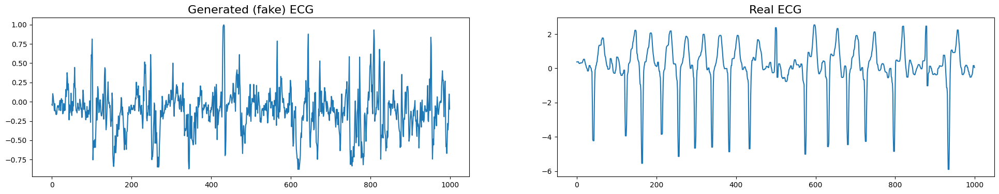

Epoch 31/3000
Generator loss: 2.49936842918396
Discriminator loss: 180010944.0
-------------------
Epoch 32/3000
Generator loss: 2.5274713039398193
Discriminator loss: 180056288.0
-------------------
Epoch 33/3000
Generator loss: 2.4629836082458496
Discriminator loss: 172901504.0
-------------------
Epoch 34/3000
Generator loss: 2.4758269786834717
Discriminator loss: 182689280.0
-------------------
Epoch 35/3000
Generator loss: 2.4111289978027344
Discriminator loss: 185529952.0
-------------------
Epoch 36/3000
Generator loss: 2.5252041816711426
Discriminator loss: 176462912.0
-------------------
Epoch 37/3000
Generator loss: 2.473404884338379
Discriminator loss: 186729856.0
-------------------
Epoch 38/3000
Generator loss: 2.539675712585449
Discriminator loss: 177838240.0
-------------------
Epoch 39/3000
Generator loss: 2.5023834705352783
Discriminator loss: 178992000.0
-------------------
Epoch 40/3000
Generator loss: 2.654548406600952
Discriminator loss: 173532176.0
---------------

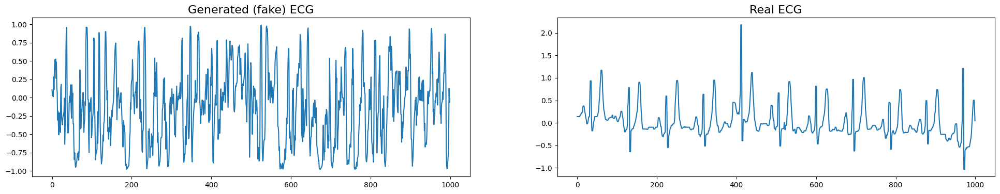

Epoch 61/3000
Generator loss: 2.575601577758789
Discriminator loss: 180944528.0
-------------------
Epoch 62/3000
Generator loss: 2.7339272499084473
Discriminator loss: 180658224.0
-------------------
Epoch 63/3000
Generator loss: 2.550771951675415
Discriminator loss: 175436480.0
-------------------
Epoch 64/3000
Generator loss: 2.681302547454834
Discriminator loss: 181119872.0
-------------------
Epoch 65/3000
Generator loss: 2.702880382537842
Discriminator loss: 181849024.0
-------------------
Epoch 66/3000
Generator loss: 2.5464446544647217
Discriminator loss: 181851200.0
-------------------
Epoch 67/3000
Generator loss: 2.6596755981445312
Discriminator loss: 172093104.0
-------------------
Epoch 68/3000
Generator loss: 2.611692190170288
Discriminator loss: 177772144.0
-------------------
Epoch 69/3000
Generator loss: 2.640399694442749
Discriminator loss: 176497216.0
-------------------
Epoch 70/3000
Generator loss: 2.6103694438934326
Discriminator loss: 173475376.0
----------------

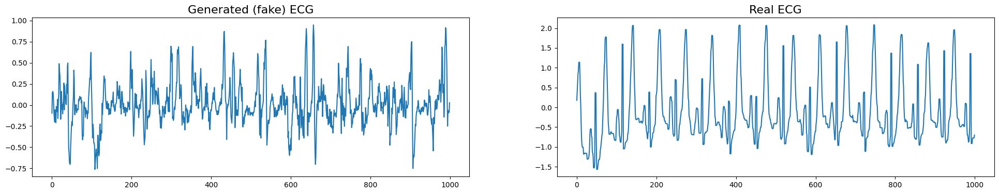

Epoch 91/3000
Generator loss: 2.5805816650390625
Discriminator loss: 184513872.0
-------------------
Epoch 92/3000
Generator loss: 2.682617664337158
Discriminator loss: 176000512.0
-------------------
Epoch 93/3000
Generator loss: 2.571887731552124
Discriminator loss: 176666672.0
-------------------
Epoch 94/3000
Generator loss: 2.50407075881958
Discriminator loss: 180474112.0
-------------------
Epoch 95/3000
Generator loss: 2.599710702896118
Discriminator loss: 176724096.0
-------------------
Epoch 96/3000
Generator loss: 2.452070713043213
Discriminator loss: 178415520.0
-------------------
Epoch 97/3000
Generator loss: 2.4313700199127197
Discriminator loss: 191805184.0
-------------------
Epoch 98/3000
Generator loss: 2.621640205383301
Discriminator loss: 175657792.0
-------------------
Epoch 99/3000
Generator loss: 2.5703439712524414
Discriminator loss: 169903968.0
-------------------
Epoch 100/3000
Generator loss: 2.561302661895752
Discriminator loss: 186091808.0
-----------------

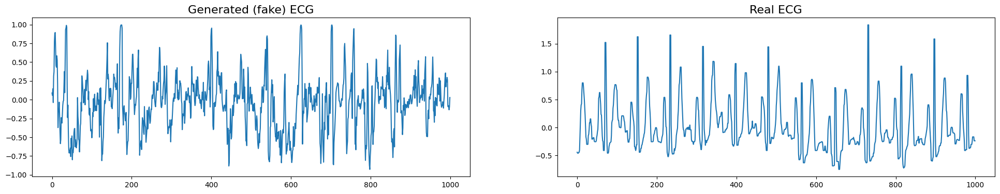

Epoch 121/3000
Generator loss: 2.6964497566223145
Discriminator loss: 164405440.0
-------------------
Epoch 122/3000
Generator loss: 2.6073873043060303
Discriminator loss: 175041360.0
-------------------
Epoch 123/3000
Generator loss: 2.925157070159912
Discriminator loss: 175390576.0
-------------------
Epoch 124/3000
Generator loss: 2.757891893386841
Discriminator loss: 176409728.0
-------------------
Epoch 125/3000
Generator loss: 2.531162738800049
Discriminator loss: 179997584.0
-------------------
Epoch 126/3000
Generator loss: 2.630897045135498
Discriminator loss: 185697792.0
-------------------
Epoch 127/3000
Generator loss: 2.6347665786743164
Discriminator loss: 175861328.0
-------------------
Epoch 128/3000
Generator loss: 2.6294350624084473
Discriminator loss: 175225200.0
-------------------
Epoch 129/3000
Generator loss: 2.652107000350952
Discriminator loss: 170633808.0
-------------------
Epoch 130/3000
Generator loss: 2.587386131286621
Discriminator loss: 180686640.0
------

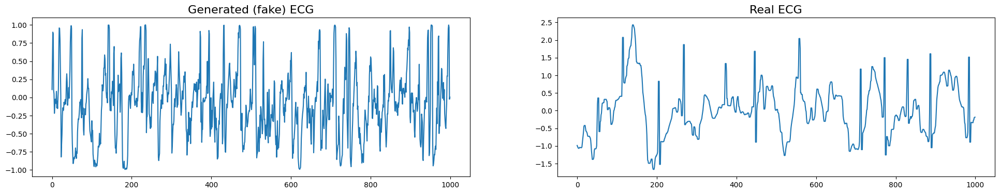

Epoch 151/3000
Generator loss: 2.72973895072937
Discriminator loss: 174277456.0
-------------------
Epoch 152/3000
Generator loss: 2.759768486022949
Discriminator loss: 174654688.0
-------------------
Epoch 153/3000
Generator loss: 2.523355484008789
Discriminator loss: 186388752.0
-------------------
Epoch 154/3000
Generator loss: 2.604309558868408
Discriminator loss: 182033760.0
-------------------
Epoch 155/3000
Generator loss: 2.6811904907226562
Discriminator loss: 181429440.0
-------------------
Epoch 156/3000
Generator loss: 2.6166017055511475
Discriminator loss: 175834048.0
-------------------
Epoch 157/3000
Generator loss: 2.6194403171539307
Discriminator loss: 171827232.0
-------------------
Epoch 158/3000
Generator loss: 2.712217330932617
Discriminator loss: 176532992.0
-------------------
Epoch 159/3000
Generator loss: 2.6723766326904297
Discriminator loss: 174509712.0
-------------------
Epoch 160/3000
Generator loss: 2.574415683746338
Discriminator loss: 186274720.0
-------

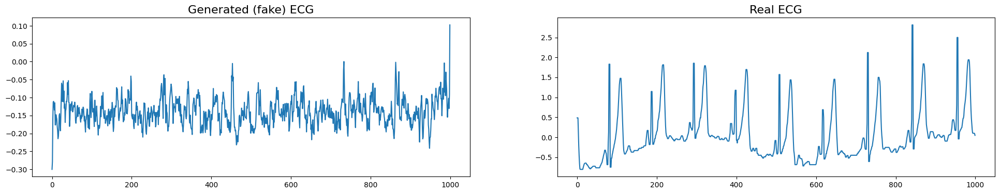

Epoch 181/3000
Generator loss: 2.623198986053467
Discriminator loss: 176388112.0
-------------------
Epoch 182/3000
Generator loss: 2.5560755729675293
Discriminator loss: 178479264.0
-------------------
Epoch 183/3000
Generator loss: 2.5920097827911377
Discriminator loss: 179329488.0
-------------------
Epoch 184/3000
Generator loss: 2.561361789703369
Discriminator loss: 176448672.0
-------------------
Epoch 185/3000
Generator loss: 2.7209644317626953
Discriminator loss: 167225888.0
-------------------
Epoch 186/3000
Generator loss: 2.6598970890045166
Discriminator loss: 174681760.0
-------------------
Epoch 187/3000
Generator loss: 2.7764697074890137
Discriminator loss: 174018400.0
-------------------
Epoch 188/3000
Generator loss: 2.5603466033935547
Discriminator loss: 174242352.0
-------------------
Epoch 189/3000
Generator loss: 2.6588125228881836
Discriminator loss: 178420240.0
-------------------
Epoch 190/3000
Generator loss: 2.6933135986328125
Discriminator loss: 176172592.0
--

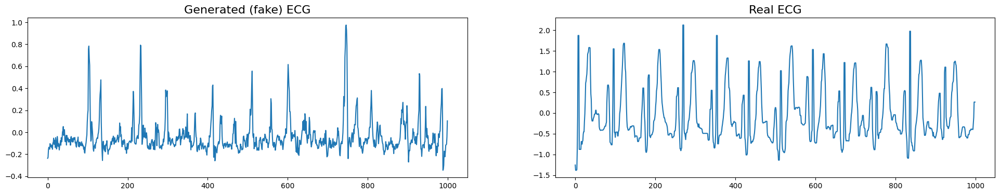

Epoch 211/3000
Generator loss: 2.4921817779541016
Discriminator loss: 174982944.0
-------------------
Epoch 212/3000
Generator loss: 2.5742549896240234
Discriminator loss: 181489584.0
-------------------
Epoch 213/3000
Generator loss: 2.67472505569458
Discriminator loss: 174529296.0
-------------------
Epoch 214/3000
Generator loss: 2.658179759979248
Discriminator loss: 173235264.0
-------------------
Epoch 215/3000
Generator loss: 2.5887744426727295
Discriminator loss: 174744640.0
-------------------
Epoch 216/3000
Generator loss: 2.661872386932373
Discriminator loss: 180113424.0
-------------------
Epoch 217/3000
Generator loss: 2.703819751739502
Discriminator loss: 175188352.0
-------------------
Epoch 218/3000
Generator loss: 2.7147011756896973
Discriminator loss: 181679808.0
-------------------
Epoch 219/3000
Generator loss: 2.633420705795288
Discriminator loss: 179626128.0
-------------------
Epoch 220/3000
Generator loss: 2.763096809387207
Discriminator loss: 182213984.0
-------

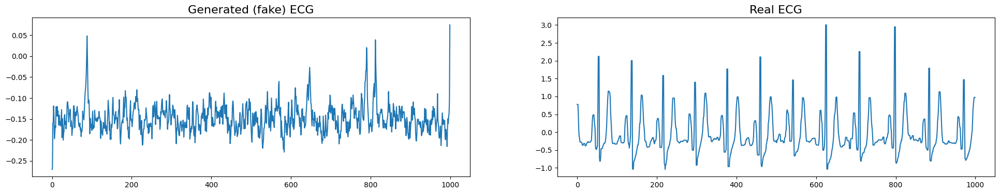

Epoch 241/3000
Generator loss: 2.6968812942504883
Discriminator loss: 179588960.0
-------------------
Epoch 242/3000
Generator loss: 2.6213178634643555
Discriminator loss: 176469024.0
-------------------
Epoch 243/3000
Generator loss: 2.553617477416992
Discriminator loss: 181920672.0
-------------------
Epoch 244/3000
Generator loss: 2.6643340587615967
Discriminator loss: 182987264.0
-------------------
Epoch 245/3000
Generator loss: 2.625936508178711
Discriminator loss: 183475472.0
-------------------
Epoch 246/3000
Generator loss: 2.597719430923462
Discriminator loss: 180067376.0
-------------------
Epoch 247/3000
Generator loss: 2.599423408508301
Discriminator loss: 172364656.0
-------------------
Epoch 248/3000
Generator loss: 2.618760108947754
Discriminator loss: 168977504.0
-------------------
Epoch 249/3000
Generator loss: 2.5909347534179688
Discriminator loss: 177121872.0
-------------------
Epoch 250/3000
Generator loss: 2.6655592918395996
Discriminator loss: 182107360.0
-----

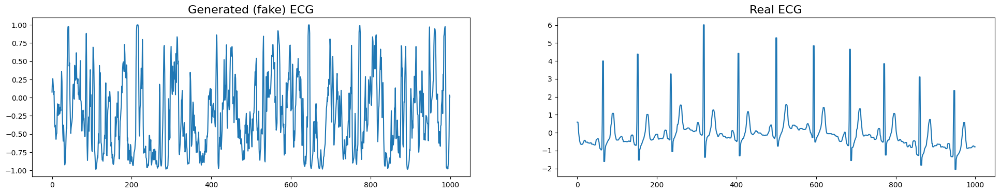

Epoch 271/3000
Generator loss: 2.5716567039489746
Discriminator loss: 176494048.0
-------------------
Epoch 272/3000
Generator loss: 2.680069923400879
Discriminator loss: 177431840.0
-------------------
Epoch 273/3000
Generator loss: 2.6919684410095215
Discriminator loss: 178031872.0
-------------------
Epoch 274/3000
Generator loss: 2.6889963150024414
Discriminator loss: 174070448.0
-------------------
Epoch 275/3000
Generator loss: 2.6574814319610596
Discriminator loss: 179713792.0
-------------------
Epoch 276/3000
Generator loss: 2.53361439704895
Discriminator loss: 178448784.0
-------------------
Epoch 277/3000
Generator loss: 2.6900758743286133
Discriminator loss: 176476000.0
-------------------
Epoch 278/3000
Generator loss: 2.5884928703308105
Discriminator loss: 182685744.0
-------------------
Epoch 279/3000
Generator loss: 2.5303220748901367
Discriminator loss: 172498784.0
-------------------
Epoch 280/3000
Generator loss: 2.5966289043426514
Discriminator loss: 180201520.0
---

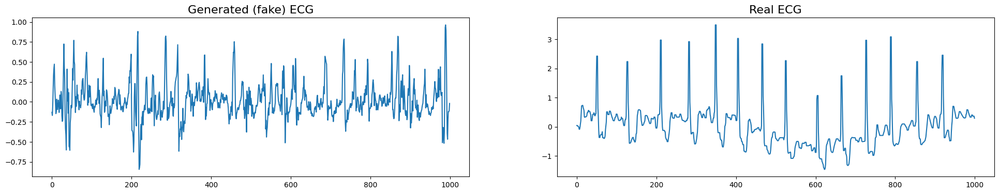

Epoch 301/3000
Generator loss: 2.7018508911132812
Discriminator loss: 171165088.0
-------------------
Epoch 302/3000
Generator loss: 2.5094618797302246
Discriminator loss: 179501376.0
-------------------
Epoch 303/3000
Generator loss: 2.675142288208008
Discriminator loss: 179219248.0
-------------------
Epoch 304/3000
Generator loss: 2.507479667663574
Discriminator loss: 185112144.0
-------------------
Epoch 305/3000
Generator loss: 2.6306440830230713
Discriminator loss: 181219584.0
-------------------
Epoch 306/3000
Generator loss: 2.830961227416992
Discriminator loss: 177284336.0
-------------------
Epoch 307/3000
Generator loss: 2.623218297958374
Discriminator loss: 181631248.0
-------------------
Epoch 308/3000
Generator loss: 2.5940160751342773
Discriminator loss: 176805216.0
-------------------
Epoch 309/3000
Generator loss: 2.690796375274658
Discriminator loss: 174120576.0
-------------------
Epoch 310/3000
Generator loss: 2.6316018104553223
Discriminator loss: 171692992.0
-----

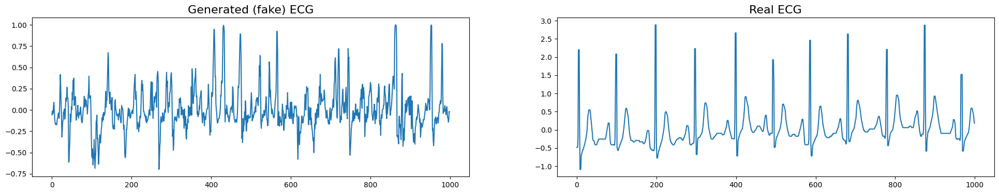

Epoch 331/3000
Generator loss: 2.764209032058716
Discriminator loss: 180253952.0
-------------------
Epoch 332/3000
Generator loss: 2.6417317390441895
Discriminator loss: 179966576.0
-------------------
Epoch 333/3000
Generator loss: 2.7101263999938965
Discriminator loss: 175834752.0
-------------------
Epoch 334/3000
Generator loss: 2.651982069015503
Discriminator loss: 166761952.0
-------------------
Epoch 335/3000
Generator loss: 2.641390800476074
Discriminator loss: 177010336.0
-------------------
Epoch 336/3000
Generator loss: 2.7158451080322266
Discriminator loss: 184592608.0
-------------------
Epoch 337/3000
Generator loss: 2.5955190658569336
Discriminator loss: 178914112.0
-------------------
Epoch 338/3000
Generator loss: 2.6364011764526367
Discriminator loss: 182006176.0
-------------------
Epoch 339/3000
Generator loss: 2.551541566848755
Discriminator loss: 178786976.0
-------------------
Epoch 340/3000
Generator loss: 2.668571949005127
Discriminator loss: 179566272.0
-----

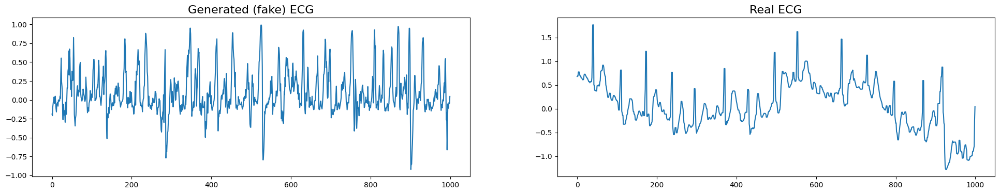

Epoch 361/3000
Generator loss: 2.6169862747192383
Discriminator loss: 169664960.0
-------------------
Epoch 362/3000
Generator loss: 2.6232354640960693
Discriminator loss: 183701264.0
-------------------
Epoch 363/3000
Generator loss: 2.5798773765563965
Discriminator loss: 175249296.0
-------------------
Epoch 364/3000
Generator loss: 2.576099157333374
Discriminator loss: 178683696.0
-------------------
Epoch 365/3000
Generator loss: 2.694049119949341
Discriminator loss: 186043056.0
-------------------
Epoch 366/3000
Generator loss: 2.594024419784546
Discriminator loss: 180489760.0
-------------------
Epoch 367/3000
Generator loss: 2.746211290359497
Discriminator loss: 179498912.0
-------------------
Epoch 368/3000
Generator loss: 2.6719393730163574
Discriminator loss: 181016432.0
-------------------
Epoch 369/3000
Generator loss: 2.7713005542755127
Discriminator loss: 175858048.0
-------------------
Epoch 370/3000
Generator loss: 2.6198625564575195
Discriminator loss: 176251232.0
----

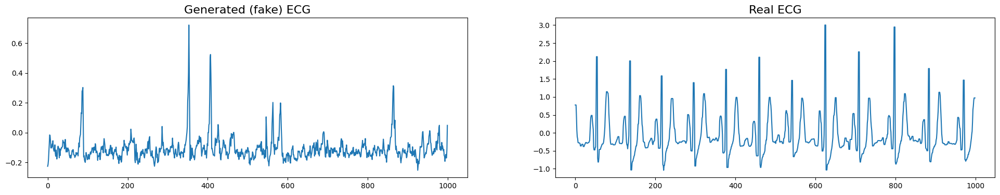

Epoch 391/3000
Generator loss: 2.5357420444488525
Discriminator loss: 181833216.0
-------------------
Epoch 392/3000
Generator loss: 2.6964352130889893
Discriminator loss: 177969856.0
-------------------
Epoch 393/3000
Generator loss: 2.6255059242248535
Discriminator loss: 178540368.0
-------------------
Epoch 394/3000
Generator loss: 2.670506477355957
Discriminator loss: 180657328.0
-------------------
Epoch 395/3000
Generator loss: 2.704441547393799
Discriminator loss: 175324256.0
-------------------
Epoch 396/3000
Generator loss: 2.762485980987549
Discriminator loss: 178497952.0
-------------------
Epoch 397/3000
Generator loss: 2.9321858882904053
Discriminator loss: 171797504.0
-------------------
Epoch 398/3000
Generator loss: 2.5829339027404785
Discriminator loss: 176921152.0
-------------------
Epoch 399/3000
Generator loss: 2.6555511951446533
Discriminator loss: 183688640.0
-------------------
Epoch 400/3000
Generator loss: 2.6376333236694336
Discriminator loss: 181996640.0
---

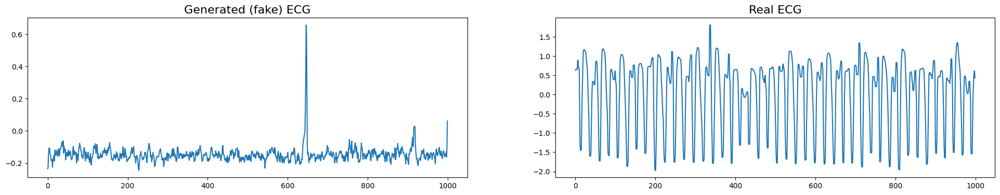

Epoch 421/3000
Generator loss: 2.6291873455047607
Discriminator loss: 180620448.0
-------------------
Epoch 422/3000
Generator loss: 2.6374385356903076
Discriminator loss: 179314016.0
-------------------
Epoch 423/3000
Generator loss: 2.754556894302368
Discriminator loss: 180080752.0
-------------------
Epoch 424/3000
Generator loss: 2.7714078426361084
Discriminator loss: 173499584.0
-------------------
Epoch 425/3000
Generator loss: 2.5897397994995117
Discriminator loss: 175621088.0
-------------------
Epoch 426/3000
Generator loss: 2.6181697845458984
Discriminator loss: 181983584.0
-------------------
Epoch 427/3000
Generator loss: 2.5964248180389404
Discriminator loss: 174858464.0
-------------------
Epoch 428/3000
Generator loss: 2.6430888175964355
Discriminator loss: 179963552.0
-------------------
Epoch 429/3000
Generator loss: 2.6659317016601562
Discriminator loss: 180799728.0
-------------------
Epoch 430/3000
Generator loss: 2.545295238494873
Discriminator loss: 176242128.0
--

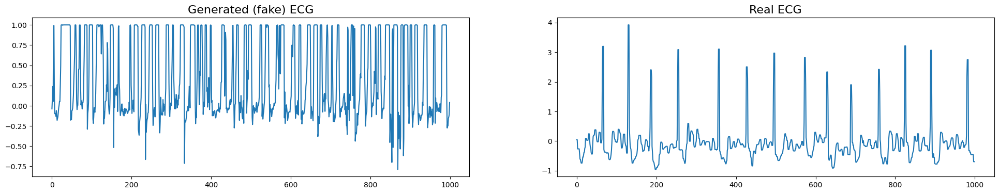

Epoch 451/3000
Generator loss: 2.700570583343506
Discriminator loss: 179255712.0
-------------------
Epoch 452/3000
Generator loss: 2.705533266067505
Discriminator loss: 176824048.0
-------------------
Epoch 453/3000
Generator loss: 2.662667751312256
Discriminator loss: 182714800.0
-------------------
Epoch 454/3000
Generator loss: 2.6227669715881348
Discriminator loss: 183453216.0
-------------------
Epoch 455/3000
Generator loss: 2.634871482849121
Discriminator loss: 177648288.0
-------------------
Epoch 456/3000
Generator loss: 2.763052225112915
Discriminator loss: 178800624.0
-------------------
Epoch 457/3000
Generator loss: 2.6615166664123535
Discriminator loss: 177063200.0
-------------------
Epoch 458/3000
Generator loss: 2.6484670639038086
Discriminator loss: 174957152.0
-------------------
Epoch 459/3000
Generator loss: 2.654940366744995
Discriminator loss: 181390112.0
-------------------
Epoch 460/3000
Generator loss: 2.5677363872528076
Discriminator loss: 188737824.0
------

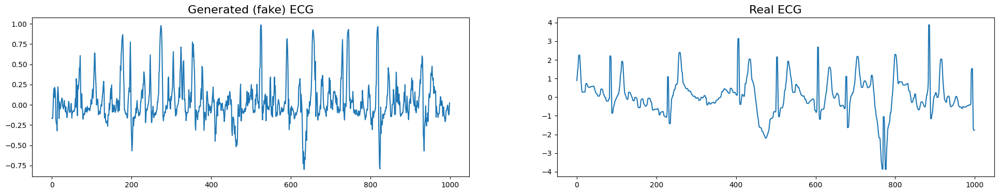

Epoch 481/3000
Generator loss: 2.6378695964813232
Discriminator loss: 175831936.0
-------------------
Epoch 482/3000
Generator loss: 2.6715173721313477
Discriminator loss: 160992352.0
-------------------
Epoch 483/3000
Generator loss: 2.5953876972198486
Discriminator loss: 181254144.0
-------------------
Epoch 484/3000
Generator loss: 2.538621425628662
Discriminator loss: 174074448.0
-------------------
Epoch 485/3000
Generator loss: 2.595472574234009
Discriminator loss: 180124640.0
-------------------
Epoch 486/3000
Generator loss: 2.6879968643188477
Discriminator loss: 184807648.0
-------------------
Epoch 487/3000
Generator loss: 2.648571014404297
Discriminator loss: 177481392.0
-------------------
Epoch 488/3000
Generator loss: 2.633448839187622
Discriminator loss: 168663408.0
-------------------
Epoch 489/3000
Generator loss: 2.667088747024536
Discriminator loss: 180404832.0
-------------------
Epoch 490/3000
Generator loss: 2.59047794342041
Discriminator loss: 182894720.0
-------

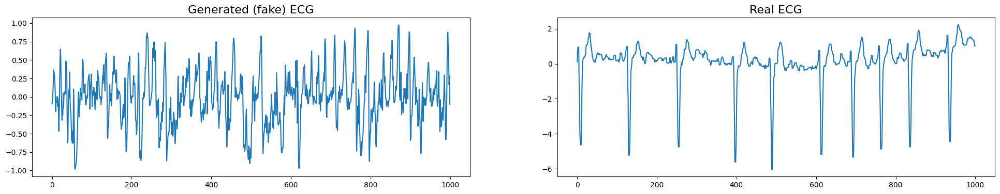

Epoch 511/3000
Generator loss: 2.524153709411621
Discriminator loss: 169819328.0
-------------------
Epoch 512/3000
Generator loss: 2.509396553039551
Discriminator loss: 183319904.0
-------------------
Epoch 513/3000
Generator loss: 2.6102397441864014
Discriminator loss: 189912768.0
-------------------
Epoch 514/3000
Generator loss: 2.451740026473999
Discriminator loss: 179805472.0
-------------------
Epoch 515/3000
Generator loss: 2.6481716632843018
Discriminator loss: 183497392.0
-------------------
Epoch 516/3000
Generator loss: 2.6325337886810303
Discriminator loss: 170155744.0
-------------------
Epoch 517/3000
Generator loss: 2.519589424133301
Discriminator loss: 183858288.0
-------------------
Epoch 518/3000
Generator loss: 2.671298027038574
Discriminator loss: 177109760.0
-------------------
Epoch 519/3000
Generator loss: 2.5755748748779297
Discriminator loss: 177568272.0
-------------------
Epoch 520/3000
Generator loss: 2.646806240081787
Discriminator loss: 174852816.0
------

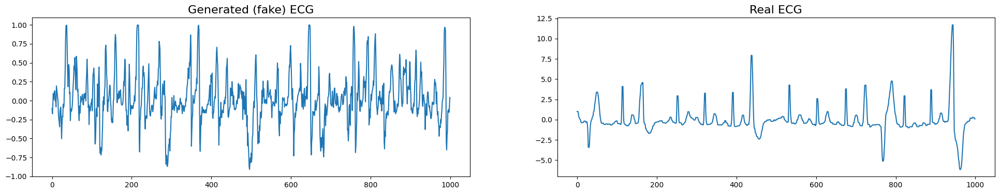

Epoch 541/3000
Generator loss: 2.701685905456543
Discriminator loss: 176529296.0
-------------------
Epoch 542/3000
Generator loss: 2.6724393367767334
Discriminator loss: 178894832.0
-------------------
Epoch 543/3000
Generator loss: 2.7164740562438965
Discriminator loss: 173044160.0
-------------------
Epoch 544/3000
Generator loss: 2.6578612327575684
Discriminator loss: 171957840.0
-------------------
Epoch 545/3000
Generator loss: 2.5855789184570312
Discriminator loss: 173286496.0
-------------------
Epoch 546/3000
Generator loss: 2.6690897941589355
Discriminator loss: 177661408.0
-------------------
Epoch 547/3000
Generator loss: 2.6461775302886963
Discriminator loss: 180434256.0
-------------------
Epoch 548/3000
Generator loss: 2.550070285797119
Discriminator loss: 177879840.0
-------------------
Epoch 549/3000
Generator loss: 2.707921028137207
Discriminator loss: 180157584.0
-------------------
Epoch 550/3000
Generator loss: 2.7465744018554688
Discriminator loss: 176013440.0
---

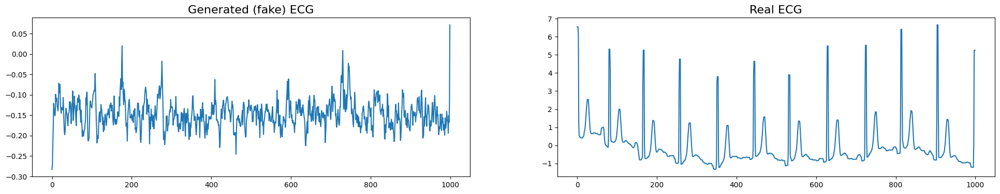

Epoch 571/3000
Generator loss: 2.514073610305786
Discriminator loss: 181480128.0
-------------------
Epoch 572/3000
Generator loss: 2.6102471351623535
Discriminator loss: 171640608.0
-------------------
Epoch 573/3000
Generator loss: 2.6739749908447266
Discriminator loss: 178051760.0
-------------------
Epoch 574/3000
Generator loss: 2.5682082176208496
Discriminator loss: 176965936.0
-------------------
Epoch 575/3000
Generator loss: 2.769637107849121
Discriminator loss: 168798592.0
-------------------
Epoch 576/3000
Generator loss: 2.7190346717834473
Discriminator loss: 180101920.0
-------------------
Epoch 577/3000
Generator loss: 2.87701153755188
Discriminator loss: 174098624.0
-------------------
Epoch 578/3000
Generator loss: 2.6549346446990967
Discriminator loss: 173068576.0
-------------------
Epoch 579/3000
Generator loss: 2.6701722145080566
Discriminator loss: 175061888.0
-------------------
Epoch 580/3000
Generator loss: 2.727759599685669
Discriminator loss: 173336560.0
-----

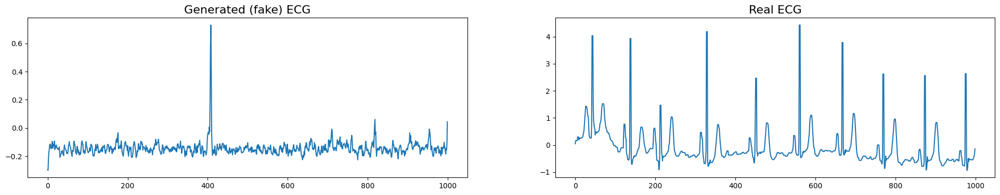

Epoch 601/3000
Generator loss: 2.6526241302490234
Discriminator loss: 176262096.0
-------------------
Epoch 602/3000
Generator loss: 2.6390864849090576
Discriminator loss: 173008384.0
-------------------
Epoch 603/3000
Generator loss: 2.63277530670166
Discriminator loss: 174412368.0
-------------------
Epoch 604/3000
Generator loss: 2.635457754135132
Discriminator loss: 176624080.0
-------------------
Epoch 605/3000
Generator loss: 2.767162799835205
Discriminator loss: 175432144.0
-------------------
Epoch 606/3000
Generator loss: 2.579357624053955
Discriminator loss: 169728800.0
-------------------
Epoch 607/3000
Generator loss: 2.6960620880126953
Discriminator loss: 184475712.0
-------------------
Epoch 608/3000
Generator loss: 2.62947940826416
Discriminator loss: 183832672.0
-------------------
Epoch 609/3000
Generator loss: 2.706407070159912
Discriminator loss: 175665024.0
-------------------
Epoch 610/3000
Generator loss: 2.473067283630371
Discriminator loss: 177390448.0
---------

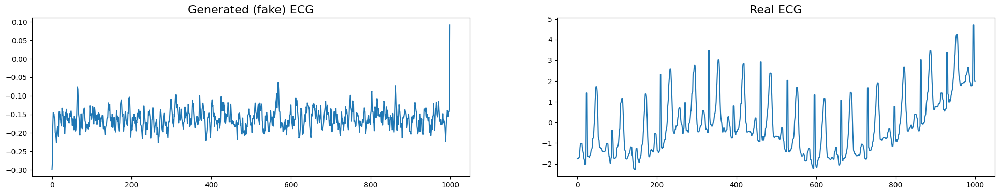

Epoch 631/3000
Generator loss: 2.733229637145996
Discriminator loss: 182869824.0
-------------------
Epoch 632/3000
Generator loss: 2.7017123699188232
Discriminator loss: 175006336.0
-------------------
Epoch 633/3000
Generator loss: 2.575550079345703
Discriminator loss: 183584288.0
-------------------
Epoch 634/3000
Generator loss: 2.6060550212860107
Discriminator loss: 177256624.0
-------------------
Epoch 635/3000
Generator loss: 2.593717575073242
Discriminator loss: 188928768.0
-------------------
Epoch 636/3000
Generator loss: 2.6149489879608154
Discriminator loss: 178029376.0
-------------------
Epoch 637/3000
Generator loss: 2.8079233169555664
Discriminator loss: 181775904.0
-------------------
Epoch 638/3000
Generator loss: 2.6041440963745117
Discriminator loss: 184314480.0
-------------------
Epoch 639/3000
Generator loss: 2.7440409660339355
Discriminator loss: 181731456.0
-------------------
Epoch 640/3000
Generator loss: 2.5849380493164062
Discriminator loss: 178418848.0
---

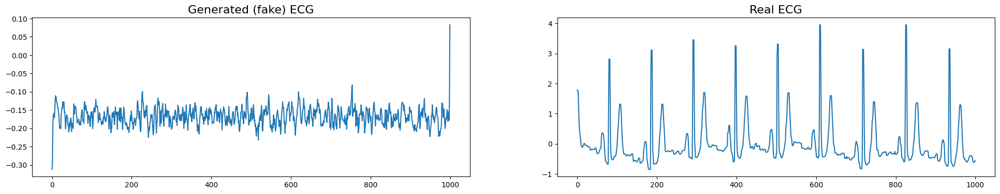

Epoch 661/3000
Generator loss: 2.5488481521606445
Discriminator loss: 181293920.0
-------------------
Epoch 662/3000
Generator loss: 2.583818197250366
Discriminator loss: 187070240.0
-------------------
Epoch 663/3000
Generator loss: 2.689908027648926
Discriminator loss: 177779072.0
-------------------
Epoch 664/3000
Generator loss: 2.567497730255127
Discriminator loss: 178063232.0
-------------------
Epoch 665/3000
Generator loss: 2.600161075592041
Discriminator loss: 171707584.0
-------------------
Epoch 666/3000
Generator loss: 2.6872053146362305
Discriminator loss: 187611040.0
-------------------
Epoch 667/3000
Generator loss: 2.615192413330078
Discriminator loss: 177159488.0
-------------------
Epoch 668/3000
Generator loss: 2.9561750888824463
Discriminator loss: 176655936.0
-------------------
Epoch 669/3000
Generator loss: 2.647050380706787
Discriminator loss: 181075584.0
-------------------
Epoch 670/3000
Generator loss: 2.5971860885620117
Discriminator loss: 179348352.0
------

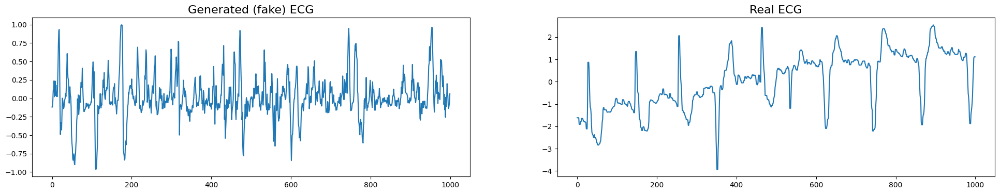

Epoch 691/3000
Generator loss: 2.6008057594299316
Discriminator loss: 179549184.0
-------------------
Epoch 692/3000
Generator loss: 2.6016764640808105
Discriminator loss: 177998368.0
-------------------
Epoch 693/3000
Generator loss: 2.5684757232666016
Discriminator loss: 180783360.0
-------------------
Epoch 694/3000
Generator loss: 2.6608269214630127
Discriminator loss: 178537120.0
-------------------
Epoch 695/3000
Generator loss: 2.684898614883423
Discriminator loss: 176547040.0
-------------------
Epoch 696/3000
Generator loss: 2.6560440063476562
Discriminator loss: 173472880.0
-------------------
Epoch 697/3000
Generator loss: 2.6067678928375244
Discriminator loss: 178839680.0
-------------------
Epoch 698/3000
Generator loss: 2.6221494674682617
Discriminator loss: 188337248.0
-------------------
Epoch 699/3000
Generator loss: 2.5032217502593994
Discriminator loss: 190225472.0
-------------------
Epoch 700/3000
Generator loss: 2.628340721130371
Discriminator loss: 188284080.0
--

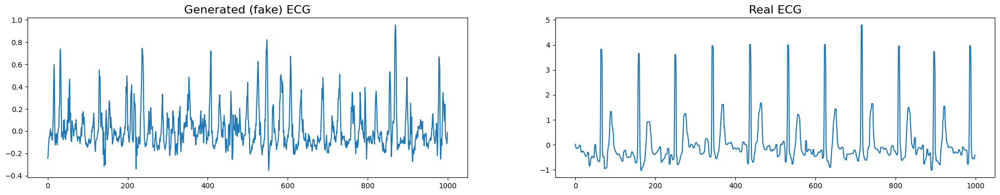

Epoch 721/3000
Generator loss: 2.64951229095459
Discriminator loss: 174804064.0
-------------------
Epoch 722/3000
Generator loss: 2.6839232444763184
Discriminator loss: 172278528.0
-------------------
Epoch 723/3000
Generator loss: 2.528850555419922
Discriminator loss: 172827200.0
-------------------
Epoch 724/3000
Generator loss: 2.7003917694091797
Discriminator loss: 181362048.0
-------------------
Epoch 725/3000
Generator loss: 2.6869068145751953
Discriminator loss: 171394976.0
-------------------
Epoch 726/3000
Generator loss: 2.463603973388672
Discriminator loss: 173437792.0
-------------------
Epoch 727/3000
Generator loss: 2.775874137878418
Discriminator loss: 168444384.0
-------------------
Epoch 728/3000
Generator loss: 2.7928924560546875
Discriminator loss: 172955328.0
-------------------
Epoch 729/3000
Generator loss: 2.5821967124938965
Discriminator loss: 186259248.0
-------------------
Epoch 730/3000
Generator loss: 2.5771875381469727
Discriminator loss: 177511664.0
-----

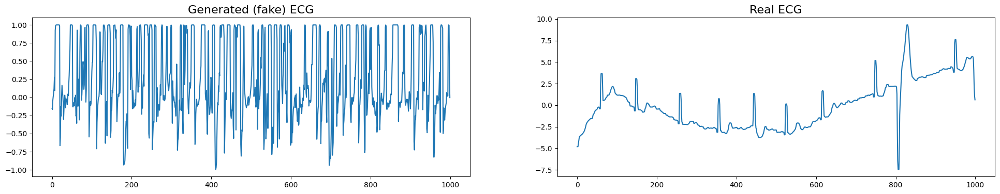

Epoch 751/3000
Generator loss: 2.518710136413574
Discriminator loss: 175116544.0
-------------------
Epoch 752/3000
Generator loss: 2.569058895111084
Discriminator loss: 180398000.0
-------------------
Epoch 753/3000
Generator loss: 2.610048770904541
Discriminator loss: 173833120.0
-------------------
Epoch 754/3000
Generator loss: 2.6560707092285156
Discriminator loss: 173059808.0
-------------------
Epoch 755/3000
Generator loss: 2.552391529083252
Discriminator loss: 180040448.0
-------------------
Epoch 756/3000
Generator loss: 2.5360653400421143
Discriminator loss: 176988224.0
-------------------
Epoch 757/3000
Generator loss: 2.6196136474609375
Discriminator loss: 179024896.0
-------------------
Epoch 758/3000
Generator loss: 2.689575672149658
Discriminator loss: 176533264.0
-------------------
Epoch 759/3000
Generator loss: 2.6339101791381836
Discriminator loss: 170587792.0
-------------------
Epoch 760/3000
Generator loss: 2.6170055866241455
Discriminator loss: 179533264.0
-----

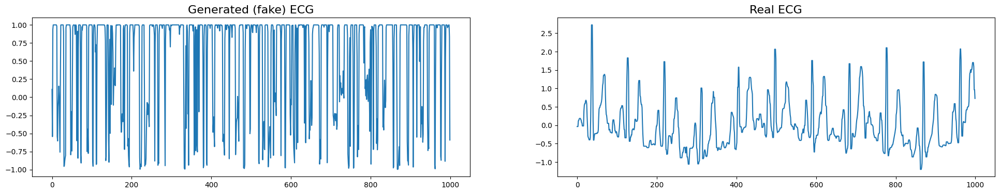

Epoch 781/3000
Generator loss: 2.6511905193328857
Discriminator loss: 170208352.0
-------------------
Epoch 782/3000
Generator loss: 2.7238643169403076
Discriminator loss: 174333216.0
-------------------
Epoch 783/3000
Generator loss: 2.660871744155884
Discriminator loss: 184245664.0
-------------------
Epoch 784/3000
Generator loss: 2.5738039016723633
Discriminator loss: 174654144.0
-------------------
Epoch 785/3000
Generator loss: 2.5626230239868164
Discriminator loss: 180642624.0
-------------------
Epoch 786/3000
Generator loss: 2.6851181983947754
Discriminator loss: 168561232.0
-------------------
Epoch 787/3000
Generator loss: 2.719954490661621
Discriminator loss: 174935760.0
-------------------
Epoch 788/3000
Generator loss: 2.601916790008545
Discriminator loss: 170981504.0
-------------------
Epoch 789/3000
Generator loss: 2.593247413635254
Discriminator loss: 184457136.0
-------------------
Epoch 790/3000
Generator loss: 2.6415600776672363
Discriminator loss: 175636928.0
----

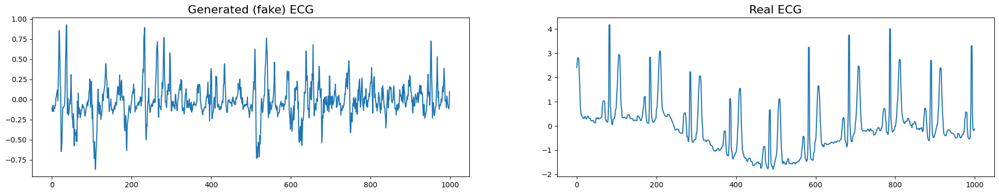

Epoch 811/3000
Generator loss: 2.5892422199249268
Discriminator loss: 179718592.0
-------------------
Epoch 812/3000
Generator loss: 2.6425158977508545
Discriminator loss: 180296272.0
-------------------
Epoch 813/3000
Generator loss: 2.682600975036621
Discriminator loss: 173015936.0
-------------------
Epoch 814/3000
Generator loss: 2.5918421745300293
Discriminator loss: 175690608.0
-------------------
Epoch 815/3000
Generator loss: 2.546260356903076
Discriminator loss: 178509056.0
-------------------
Epoch 816/3000
Generator loss: 2.61907696723938
Discriminator loss: 176020304.0
-------------------
Epoch 817/3000
Generator loss: 2.613521099090576
Discriminator loss: 182980128.0
-------------------
Epoch 818/3000
Generator loss: 2.696352005004883
Discriminator loss: 170668512.0
-------------------
Epoch 819/3000
Generator loss: 2.767026901245117
Discriminator loss: 167599920.0
-------------------
Epoch 820/3000
Generator loss: 2.652332305908203
Discriminator loss: 173252208.0
--------

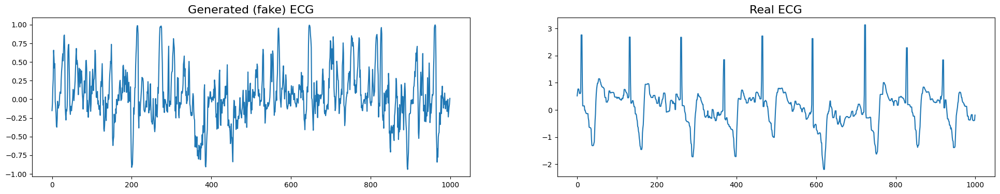

Epoch 841/3000
Generator loss: 2.6466495990753174
Discriminator loss: 173233280.0
-------------------
Epoch 842/3000
Generator loss: 2.876521587371826
Discriminator loss: 185713520.0
-------------------
Epoch 843/3000
Generator loss: 2.5659260749816895
Discriminator loss: 179006768.0
-------------------
Epoch 844/3000
Generator loss: 2.5803945064544678
Discriminator loss: 179872512.0
-------------------
Epoch 845/3000
Generator loss: 2.652193069458008
Discriminator loss: 167353024.0
-------------------
Epoch 846/3000
Generator loss: 2.6819024085998535
Discriminator loss: 179708384.0
-------------------
Epoch 847/3000
Generator loss: 2.5500712394714355
Discriminator loss: 179751888.0
-------------------
Epoch 848/3000
Generator loss: 2.642603635787964
Discriminator loss: 171562496.0
-------------------
Epoch 849/3000
Generator loss: 2.632218837738037
Discriminator loss: 180153072.0
-------------------
Epoch 850/3000
Generator loss: 2.618297576904297
Discriminator loss: 182943136.0
-----

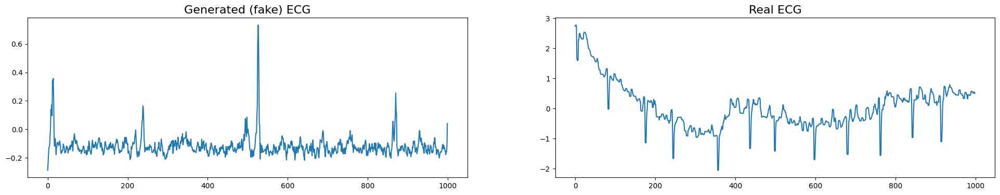

Epoch 871/3000
Generator loss: 2.6240615844726562
Discriminator loss: 182532368.0
-------------------
Epoch 872/3000
Generator loss: 2.5949645042419434
Discriminator loss: 175897968.0
-------------------
Epoch 873/3000
Generator loss: 2.6721272468566895
Discriminator loss: 174276512.0
-------------------
Epoch 874/3000
Generator loss: 2.666609287261963
Discriminator loss: 175839712.0
-------------------
Epoch 875/3000
Generator loss: 2.6265459060668945
Discriminator loss: 180558000.0
-------------------
Epoch 876/3000
Generator loss: 2.6153993606567383
Discriminator loss: 171511264.0
-------------------
Epoch 877/3000
Generator loss: 2.620417356491089
Discriminator loss: 174421520.0
-------------------
Epoch 878/3000
Generator loss: 2.4576714038848877
Discriminator loss: 187409280.0
-------------------
Epoch 879/3000
Generator loss: 2.5917255878448486
Discriminator loss: 178637152.0
-------------------
Epoch 880/3000
Generator loss: 2.837948799133301
Discriminator loss: 180620832.0
---

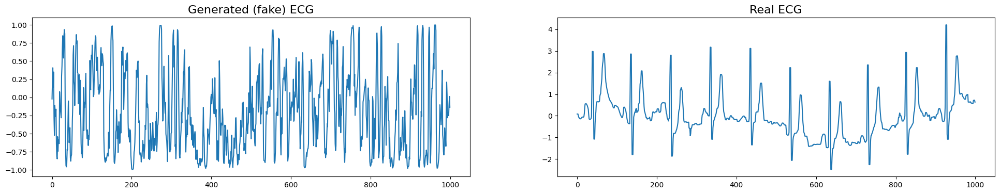

Epoch 901/3000
Generator loss: 2.6404287815093994
Discriminator loss: 180315776.0
-------------------
Epoch 902/3000
Generator loss: 2.6648519039154053
Discriminator loss: 170985792.0
-------------------
Epoch 903/3000
Generator loss: 2.8011229038238525
Discriminator loss: 174831232.0
-------------------
Epoch 904/3000
Generator loss: 2.6278884410858154
Discriminator loss: 185298448.0
-------------------
Epoch 905/3000
Generator loss: 2.4674296379089355
Discriminator loss: 180061568.0
-------------------
Epoch 906/3000
Generator loss: 2.6449804306030273
Discriminator loss: 183406032.0
-------------------
Epoch 907/3000
Generator loss: 2.621955156326294
Discriminator loss: 174906432.0
-------------------
Epoch 908/3000
Generator loss: 2.644017457962036
Discriminator loss: 176420000.0
-------------------
Epoch 909/3000
Generator loss: 2.675595760345459
Discriminator loss: 180128336.0
-------------------
Epoch 910/3000
Generator loss: 2.604355812072754
Discriminator loss: 184048672.0
----

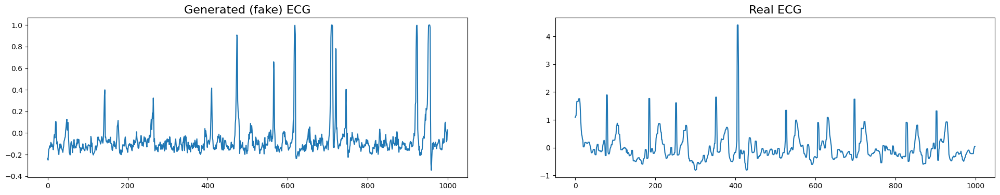

Epoch 931/3000
Generator loss: 2.60722279548645
Discriminator loss: 174677232.0
-------------------
Epoch 932/3000
Generator loss: 2.6337084770202637
Discriminator loss: 167684976.0
-------------------
Epoch 933/3000
Generator loss: 2.7480361461639404
Discriminator loss: 183629984.0
-------------------
Epoch 934/3000
Generator loss: 2.5400776863098145
Discriminator loss: 184766256.0
-------------------
Epoch 935/3000
Generator loss: 2.5512397289276123
Discriminator loss: 183674880.0
-------------------
Epoch 936/3000
Generator loss: 2.6898534297943115
Discriminator loss: 184071456.0
-------------------
Epoch 937/3000
Generator loss: 2.6005144119262695
Discriminator loss: 184621024.0
-------------------
Epoch 938/3000
Generator loss: 2.6481668949127197
Discriminator loss: 175891584.0
-------------------
Epoch 939/3000
Generator loss: 2.6340620517730713
Discriminator loss: 181563520.0
-------------------
Epoch 940/3000
Generator loss: 2.6278629302978516
Discriminator loss: 178727648.0
--

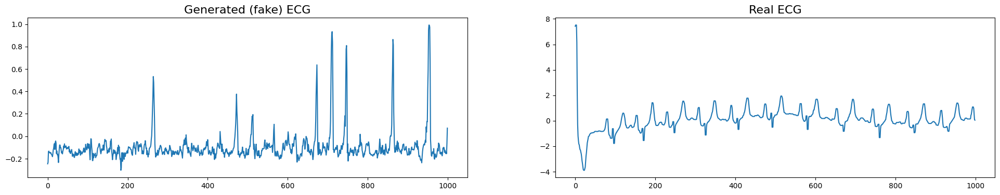

Epoch 961/3000
Generator loss: 2.5931015014648438
Discriminator loss: 177049888.0
-------------------
Epoch 962/3000
Generator loss: 2.683250904083252
Discriminator loss: 175652032.0
-------------------
Epoch 963/3000
Generator loss: 2.630697011947632
Discriminator loss: 175733312.0
-------------------
Epoch 964/3000
Generator loss: 2.5019638538360596
Discriminator loss: 173853056.0
-------------------
Epoch 965/3000
Generator loss: 2.5730111598968506
Discriminator loss: 179879104.0
-------------------
Epoch 966/3000
Generator loss: 2.6268539428710938
Discriminator loss: 176185568.0
-------------------
Epoch 967/3000
Generator loss: 2.5069580078125
Discriminator loss: 169033920.0
-------------------
Epoch 968/3000
Generator loss: 2.5731568336486816
Discriminator loss: 176840640.0
-------------------
Epoch 969/3000
Generator loss: 2.6360087394714355
Discriminator loss: 172883584.0
-------------------
Epoch 970/3000
Generator loss: 2.664698362350464
Discriminator loss: 170966720.0
------

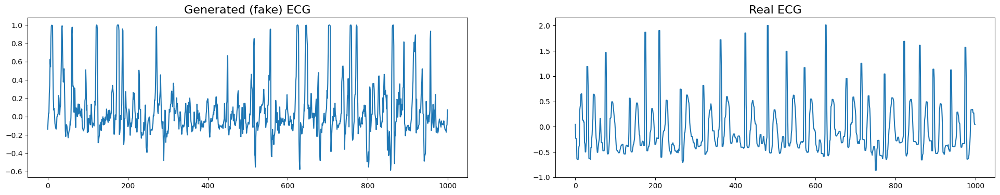

Epoch 991/3000
Generator loss: 2.639662742614746
Discriminator loss: 180013280.0
-------------------
Epoch 992/3000
Generator loss: 2.6034319400787354
Discriminator loss: 185324160.0
-------------------
Epoch 993/3000
Generator loss: 2.5785789489746094
Discriminator loss: 181005440.0
-------------------
Epoch 994/3000
Generator loss: 2.4665818214416504
Discriminator loss: 191302912.0
-------------------
Epoch 995/3000
Generator loss: 2.6264607906341553
Discriminator loss: 177589600.0
-------------------
Epoch 996/3000
Generator loss: 2.671861171722412
Discriminator loss: 173190640.0
-------------------
Epoch 997/3000
Generator loss: 2.5928804874420166
Discriminator loss: 172190592.0
-------------------
Epoch 998/3000
Generator loss: 2.5888290405273438
Discriminator loss: 176966176.0
-------------------
Epoch 999/3000
Generator loss: 2.5530591011047363
Discriminator loss: 188608400.0
-------------------
Epoch 1000/3000
Generator loss: 2.6628386974334717
Discriminator loss: 187676416.0
-

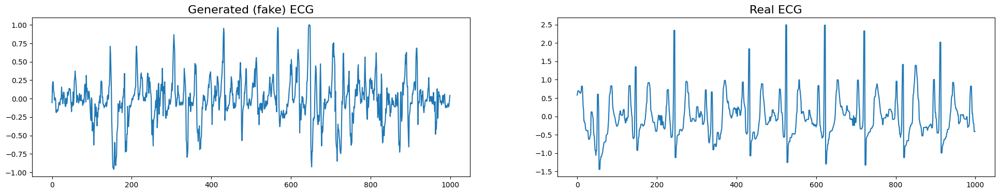

Epoch 1021/3000
Generator loss: 2.734407663345337
Discriminator loss: 158942576.0
-------------------
Epoch 1022/3000
Generator loss: 2.647749423980713
Discriminator loss: 184201040.0
-------------------
Epoch 1023/3000
Generator loss: 2.7155327796936035
Discriminator loss: 182781696.0
-------------------
Epoch 1024/3000
Generator loss: 2.7254230976104736
Discriminator loss: 181253984.0
-------------------
Epoch 1025/3000
Generator loss: 2.615309715270996
Discriminator loss: 174686592.0
-------------------
Epoch 1026/3000
Generator loss: 2.652437925338745
Discriminator loss: 180616080.0
-------------------
Epoch 1027/3000
Generator loss: 2.615499973297119
Discriminator loss: 182844400.0
-------------------
Epoch 1028/3000
Generator loss: 2.6488592624664307
Discriminator loss: 169565472.0
-------------------
Epoch 1029/3000
Generator loss: 2.5498294830322266
Discriminator loss: 168381536.0
-------------------
Epoch 1030/3000
Generator loss: 2.6238605976104736
Discriminator loss: 1770186

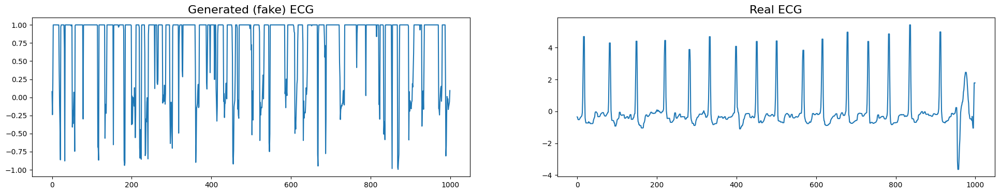

Epoch 1051/3000
Generator loss: 2.6289525032043457
Discriminator loss: 184287488.0
-------------------
Epoch 1052/3000
Generator loss: 2.6548469066619873
Discriminator loss: 177613168.0
-------------------
Epoch 1053/3000
Generator loss: 2.596531867980957
Discriminator loss: 174139840.0
-------------------
Epoch 1054/3000
Generator loss: 2.6333141326904297
Discriminator loss: 167510240.0
-------------------
Epoch 1055/3000
Generator loss: 2.6781325340270996
Discriminator loss: 176168784.0
-------------------
Epoch 1056/3000
Generator loss: 2.7244248390197754
Discriminator loss: 184186720.0
-------------------
Epoch 1057/3000
Generator loss: 2.590057373046875
Discriminator loss: 180350448.0
-------------------
Epoch 1058/3000
Generator loss: 2.687647819519043
Discriminator loss: 172434592.0
-------------------
Epoch 1059/3000
Generator loss: 2.6365299224853516
Discriminator loss: 185610176.0
-------------------
Epoch 1060/3000
Generator loss: 2.6488137245178223
Discriminator loss: 18238

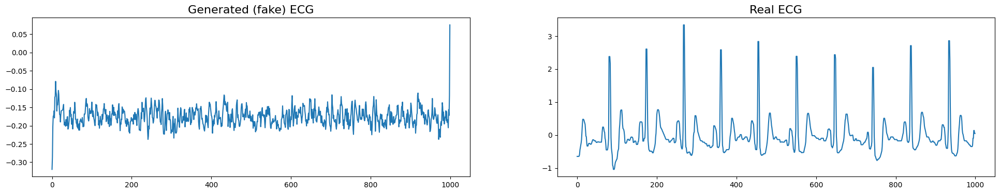

Epoch 1081/3000
Generator loss: 2.543985366821289
Discriminator loss: 183946624.0
-------------------
Epoch 1082/3000
Generator loss: 2.671344041824341
Discriminator loss: 176216976.0
-------------------
Epoch 1083/3000
Generator loss: 2.6454246044158936
Discriminator loss: 182188416.0
-------------------
Epoch 1084/3000
Generator loss: 2.540818214416504
Discriminator loss: 175456928.0
-------------------
Epoch 1085/3000
Generator loss: 2.722487211227417
Discriminator loss: 178692640.0
-------------------
Epoch 1086/3000
Generator loss: 2.673325777053833
Discriminator loss: 180689376.0
-------------------
Epoch 1087/3000
Generator loss: 2.627932548522949
Discriminator loss: 176355808.0
-------------------
Epoch 1088/3000
Generator loss: 2.5681960582733154
Discriminator loss: 179425776.0
-------------------
Epoch 1089/3000
Generator loss: 2.6180105209350586
Discriminator loss: 181163584.0
-------------------
Epoch 1090/3000
Generator loss: 2.6234965324401855
Discriminator loss: 18057438

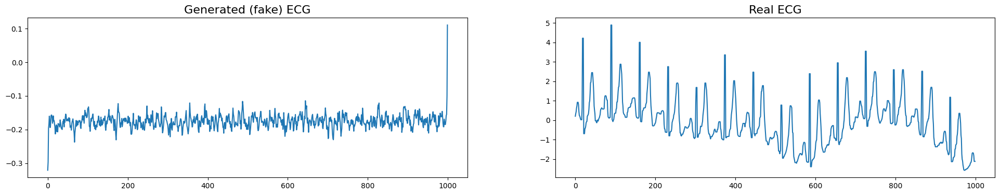

Epoch 1111/3000
Generator loss: 2.576531410217285
Discriminator loss: 184836864.0
-------------------
Epoch 1112/3000
Generator loss: 2.7196359634399414
Discriminator loss: 180102080.0
-------------------
Epoch 1113/3000
Generator loss: 2.5820202827453613
Discriminator loss: 176992896.0
-------------------
Epoch 1114/3000
Generator loss: 2.5352468490600586
Discriminator loss: 174421888.0
-------------------
Epoch 1115/3000
Generator loss: 2.621408224105835
Discriminator loss: 184958688.0
-------------------
Epoch 1116/3000
Generator loss: 2.6624112129211426
Discriminator loss: 168905056.0
-------------------
Epoch 1117/3000
Generator loss: 2.647078275680542
Discriminator loss: 178790752.0
-------------------
Epoch 1118/3000
Generator loss: 2.6274030208587646
Discriminator loss: 174634720.0
-------------------
Epoch 1119/3000
Generator loss: 2.5267386436462402
Discriminator loss: 182389504.0
-------------------
Epoch 1120/3000
Generator loss: 2.6626477241516113
Discriminator loss: 17188

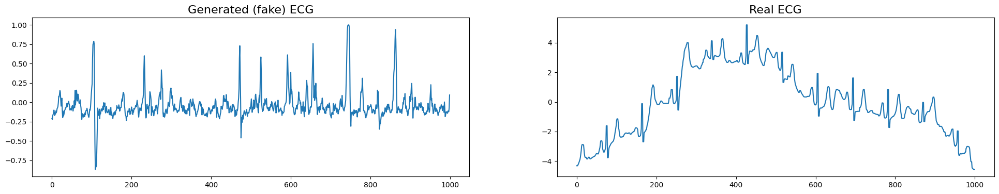

Epoch 1141/3000
Generator loss: 2.679870367050171
Discriminator loss: 176881376.0
-------------------
Epoch 1142/3000
Generator loss: 2.6593141555786133
Discriminator loss: 176196048.0
-------------------
Epoch 1143/3000
Generator loss: 2.475078582763672
Discriminator loss: 173467680.0
-------------------
Epoch 1144/3000
Generator loss: 2.6308207511901855
Discriminator loss: 179945536.0
-------------------
Epoch 1145/3000
Generator loss: 2.792954921722412
Discriminator loss: 175357600.0
-------------------
Epoch 1146/3000
Generator loss: 2.5682148933410645
Discriminator loss: 170943680.0
-------------------
Epoch 1147/3000
Generator loss: 2.6450977325439453
Discriminator loss: 185131104.0
-------------------
Epoch 1148/3000
Generator loss: 2.6710829734802246
Discriminator loss: 179718288.0
-------------------
Epoch 1149/3000
Generator loss: 2.6140756607055664
Discriminator loss: 179815648.0
-------------------
Epoch 1150/3000
Generator loss: 2.6526646614074707
Discriminator loss: 17949

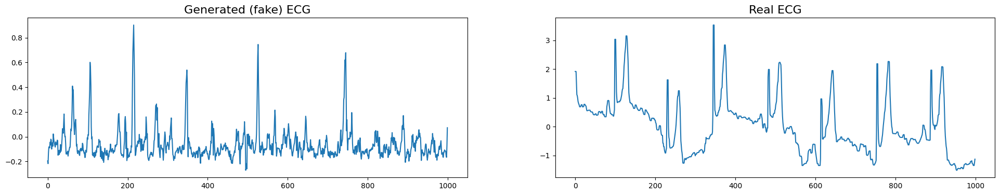

Epoch 1171/3000
Generator loss: 2.6380577087402344
Discriminator loss: 185978256.0
-------------------
Epoch 1172/3000
Generator loss: 2.6403119564056396
Discriminator loss: 179427648.0
-------------------
Epoch 1173/3000
Generator loss: 2.601134777069092
Discriminator loss: 177598112.0
-------------------
Epoch 1174/3000
Generator loss: 2.7724926471710205
Discriminator loss: 173410816.0
-------------------
Epoch 1175/3000
Generator loss: 2.5377614498138428
Discriminator loss: 180509632.0
-------------------
Epoch 1176/3000
Generator loss: 2.6318135261535645
Discriminator loss: 184778784.0
-------------------
Epoch 1177/3000
Generator loss: 2.7309927940368652
Discriminator loss: 183296976.0
-------------------
Epoch 1178/3000
Generator loss: 2.7280778884887695
Discriminator loss: 173455072.0
-------------------
Epoch 1179/3000
Generator loss: 2.5824947357177734
Discriminator loss: 177753312.0
-------------------
Epoch 1180/3000
Generator loss: 2.6250696182250977
Discriminator loss: 176

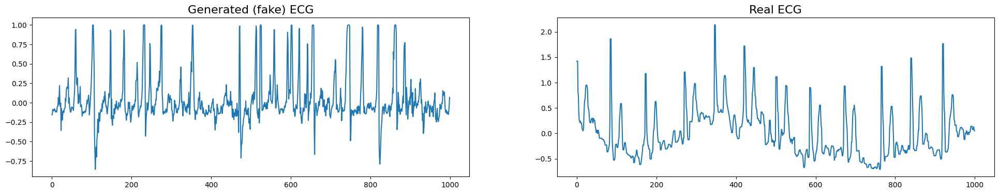

Epoch 1201/3000
Generator loss: 2.7283737659454346
Discriminator loss: 175220272.0
-------------------
Epoch 1202/3000
Generator loss: 2.6781418323516846
Discriminator loss: 178966336.0
-------------------
Epoch 1203/3000
Generator loss: 2.6106345653533936
Discriminator loss: 181761888.0
-------------------
Epoch 1204/3000
Generator loss: 2.662468910217285
Discriminator loss: 179274000.0
-------------------
Epoch 1205/3000
Generator loss: 2.6276421546936035
Discriminator loss: 186345408.0
-------------------
Epoch 1206/3000
Generator loss: 2.5778708457946777
Discriminator loss: 181505088.0
-------------------
Epoch 1207/3000
Generator loss: 2.552199363708496
Discriminator loss: 179809632.0
-------------------
Epoch 1208/3000
Generator loss: 2.6392812728881836
Discriminator loss: 177724832.0
-------------------
Epoch 1209/3000
Generator loss: 2.635763645172119
Discriminator loss: 181730080.0
-------------------
Epoch 1210/3000
Generator loss: 2.8085665702819824
Discriminator loss: 17117

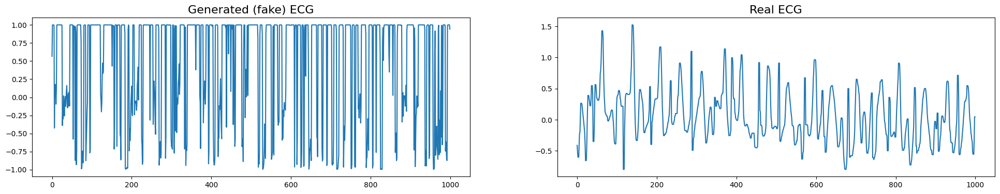

Epoch 1231/3000
Generator loss: 2.6286377906799316
Discriminator loss: 178496512.0
-------------------
Epoch 1232/3000
Generator loss: 2.6290767192840576
Discriminator loss: 176451328.0
-------------------
Epoch 1233/3000
Generator loss: 2.6760668754577637
Discriminator loss: 166424608.0
-------------------
Epoch 1234/3000
Generator loss: 2.6360034942626953
Discriminator loss: 169521888.0
-------------------
Epoch 1235/3000
Generator loss: 2.539612293243408
Discriminator loss: 177601408.0
-------------------
Epoch 1236/3000
Generator loss: 2.60575270652771
Discriminator loss: 173617088.0
-------------------
Epoch 1237/3000
Generator loss: 2.6645383834838867
Discriminator loss: 172304608.0
-------------------
Epoch 1238/3000
Generator loss: 2.6150574684143066
Discriminator loss: 181289536.0
-------------------
Epoch 1239/3000
Generator loss: 2.6397480964660645
Discriminator loss: 183212608.0
-------------------
Epoch 1240/3000
Generator loss: 2.6537115573883057
Discriminator loss: 17807

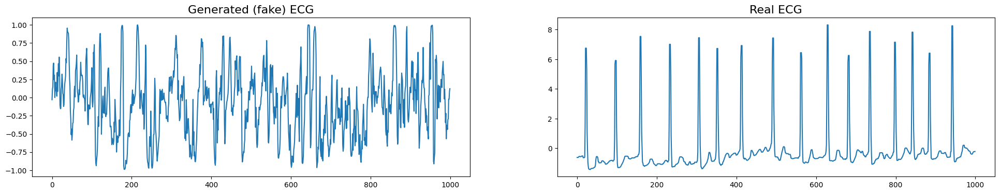

Epoch 1261/3000
Generator loss: 2.5941483974456787
Discriminator loss: 186050912.0
-------------------
Epoch 1262/3000
Generator loss: 2.7782771587371826
Discriminator loss: 171600816.0
-------------------
Epoch 1263/3000
Generator loss: 2.743387460708618
Discriminator loss: 166646432.0
-------------------
Epoch 1264/3000
Generator loss: 2.58713960647583
Discriminator loss: 184761600.0
-------------------
Epoch 1265/3000
Generator loss: 2.722344160079956
Discriminator loss: 177835680.0
-------------------
Epoch 1266/3000
Generator loss: 2.6598215103149414
Discriminator loss: 175999072.0
-------------------
Epoch 1267/3000
Generator loss: 2.6874842643737793
Discriminator loss: 176398432.0
-------------------
Epoch 1268/3000
Generator loss: 2.583134651184082
Discriminator loss: 174306096.0
-------------------
Epoch 1269/3000
Generator loss: 2.58760142326355
Discriminator loss: 180466048.0
-------------------
Epoch 1270/3000
Generator loss: 2.7125937938690186
Discriminator loss: 174945952

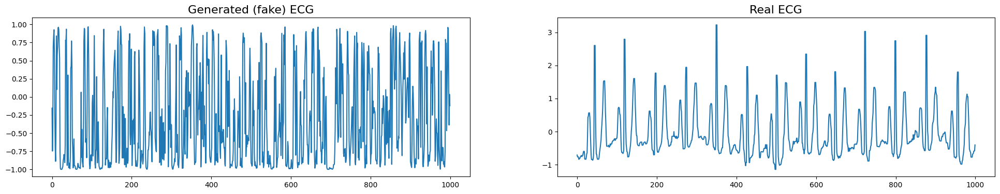

Epoch 1291/3000
Generator loss: 2.7161097526550293
Discriminator loss: 176474752.0
-------------------
Epoch 1292/3000
Generator loss: 2.71951961517334
Discriminator loss: 174157792.0
-------------------
Epoch 1293/3000
Generator loss: 2.6387908458709717
Discriminator loss: 174979872.0
-------------------
Epoch 1294/3000
Generator loss: 2.5459039211273193
Discriminator loss: 179315184.0
-------------------
Epoch 1295/3000
Generator loss: 2.475637912750244
Discriminator loss: 182710432.0
-------------------
Epoch 1296/3000
Generator loss: 2.534712553024292
Discriminator loss: 168978384.0
-------------------
Epoch 1297/3000
Generator loss: 2.769878387451172
Discriminator loss: 171259824.0
-------------------
Epoch 1298/3000
Generator loss: 2.6549386978149414
Discriminator loss: 178700768.0
-------------------
Epoch 1299/3000
Generator loss: 2.629408359527588
Discriminator loss: 180388688.0
-------------------
Epoch 1300/3000
Generator loss: 2.7459182739257812
Discriminator loss: 16590537

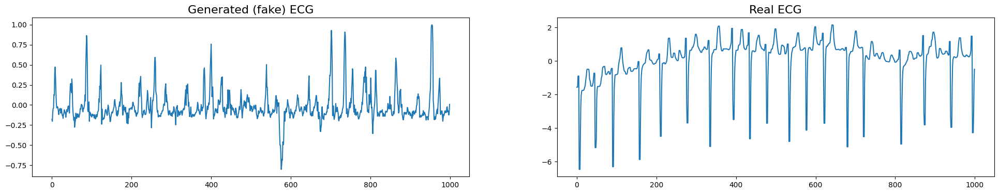

Epoch 1321/3000
Generator loss: 2.6164188385009766
Discriminator loss: 167862992.0
-------------------
Epoch 1322/3000
Generator loss: 2.623236894607544
Discriminator loss: 179104160.0
-------------------
Epoch 1323/3000
Generator loss: 2.6018638610839844
Discriminator loss: 184481424.0
-------------------
Epoch 1324/3000
Generator loss: 2.686530828475952
Discriminator loss: 170965888.0
-------------------
Epoch 1325/3000
Generator loss: 2.6483774185180664
Discriminator loss: 184370256.0
-------------------
Epoch 1326/3000
Generator loss: 2.5658817291259766
Discriminator loss: 167833104.0
-------------------
Epoch 1327/3000
Generator loss: 2.569390296936035
Discriminator loss: 184192576.0
-------------------
Epoch 1328/3000
Generator loss: 2.6818149089813232
Discriminator loss: 176209664.0
-------------------
Epoch 1329/3000
Generator loss: 2.599606990814209
Discriminator loss: 177037952.0
-------------------
Epoch 1330/3000
Generator loss: 2.5613913536071777
Discriminator loss: 177540

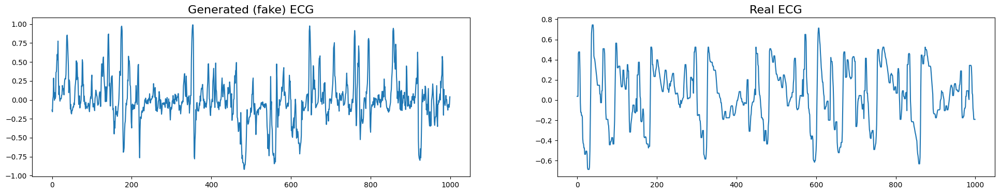

Epoch 1351/3000
Generator loss: 2.5630640983581543
Discriminator loss: 183234272.0
-------------------
Epoch 1352/3000
Generator loss: 2.5664596557617188
Discriminator loss: 176981040.0
-------------------
Epoch 1353/3000
Generator loss: 2.5131092071533203
Discriminator loss: 186702752.0
-------------------
Epoch 1354/3000
Generator loss: 2.6207022666931152
Discriminator loss: 184761792.0
-------------------
Epoch 1355/3000
Generator loss: 2.588602066040039
Discriminator loss: 176702752.0
-------------------
Epoch 1356/3000
Generator loss: 2.560727596282959
Discriminator loss: 170783328.0
-------------------
Epoch 1357/3000
Generator loss: 2.7902660369873047
Discriminator loss: 179575088.0
-------------------
Epoch 1358/3000
Generator loss: 2.6447746753692627
Discriminator loss: 176283808.0
-------------------
Epoch 1359/3000
Generator loss: 2.6226844787597656
Discriminator loss: 175525952.0
-------------------
Epoch 1360/3000
Generator loss: 2.980314254760742
Discriminator loss: 16974

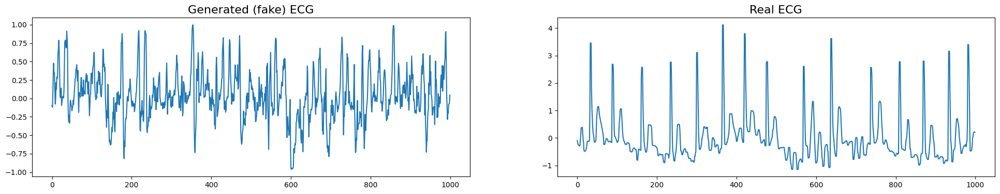

Epoch 1381/3000
Generator loss: 2.6235926151275635
Discriminator loss: 178276560.0
-------------------
Epoch 1382/3000
Generator loss: 2.5835912227630615
Discriminator loss: 186878352.0
-------------------
Epoch 1383/3000
Generator loss: 2.5932528972625732
Discriminator loss: 180911776.0
-------------------
Epoch 1384/3000
Generator loss: 2.5862488746643066
Discriminator loss: 177292480.0
-------------------
Epoch 1385/3000
Generator loss: 2.662674903869629
Discriminator loss: 169585008.0
-------------------
Epoch 1386/3000
Generator loss: 2.5685925483703613
Discriminator loss: 177876512.0
-------------------
Epoch 1387/3000
Generator loss: 2.4858503341674805
Discriminator loss: 178677856.0
-------------------
Epoch 1388/3000
Generator loss: 2.6549124717712402
Discriminator loss: 165159584.0
-------------------
Epoch 1389/3000
Generator loss: 2.6971778869628906
Discriminator loss: 171854688.0
-------------------
Epoch 1390/3000
Generator loss: 2.61871337890625
Discriminator loss: 17439

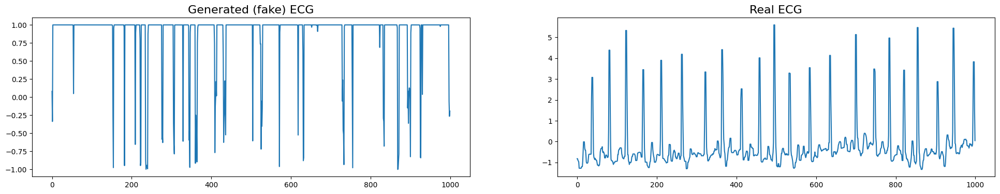

Epoch 1411/3000
Generator loss: 2.5956549644470215
Discriminator loss: 177369056.0
-------------------
Epoch 1412/3000
Generator loss: 2.499699115753174
Discriminator loss: 181741088.0
-------------------
Epoch 1413/3000
Generator loss: 2.5965218544006348
Discriminator loss: 178411840.0
-------------------
Epoch 1414/3000
Generator loss: 2.6322150230407715
Discriminator loss: 182075104.0
-------------------
Epoch 1415/3000
Generator loss: 2.723147392272949
Discriminator loss: 175525408.0
-------------------
Epoch 1416/3000
Generator loss: 2.5748212337493896
Discriminator loss: 183883824.0
-------------------
Epoch 1417/3000
Generator loss: 2.6362500190734863
Discriminator loss: 183646496.0
-------------------
Epoch 1418/3000
Generator loss: 2.637907028198242
Discriminator loss: 173112464.0
-------------------
Epoch 1419/3000
Generator loss: 2.680302143096924
Discriminator loss: 177065952.0
-------------------
Epoch 1420/3000
Generator loss: 2.711068630218506
Discriminator loss: 1724568

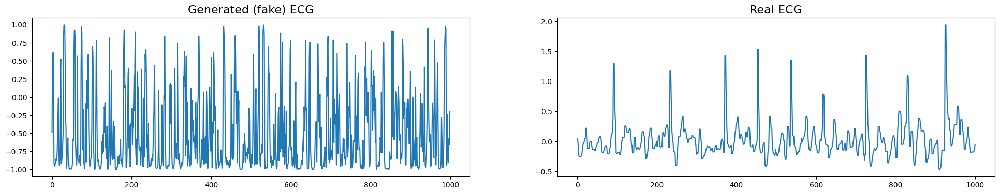

Epoch 1441/3000
Generator loss: 2.5917811393737793
Discriminator loss: 179341008.0
-------------------
Epoch 1442/3000
Generator loss: 2.6099929809570312
Discriminator loss: 178911488.0
-------------------
Epoch 1443/3000
Generator loss: 2.6814169883728027
Discriminator loss: 179100000.0
-------------------
Epoch 1444/3000
Generator loss: 2.6164002418518066
Discriminator loss: 175270496.0
-------------------
Epoch 1445/3000
Generator loss: 2.6705880165100098
Discriminator loss: 177332672.0
-------------------
Epoch 1446/3000
Generator loss: 2.9086484909057617
Discriminator loss: 172228288.0
-------------------
Epoch 1447/3000
Generator loss: 2.6594185829162598
Discriminator loss: 174093248.0
-------------------
Epoch 1448/3000
Generator loss: 2.6346404552459717
Discriminator loss: 178564064.0
-------------------
Epoch 1449/3000
Generator loss: 2.5561976432800293
Discriminator loss: 177750608.0
-------------------
Epoch 1450/3000
Generator loss: 2.563812732696533
Discriminator loss: 179

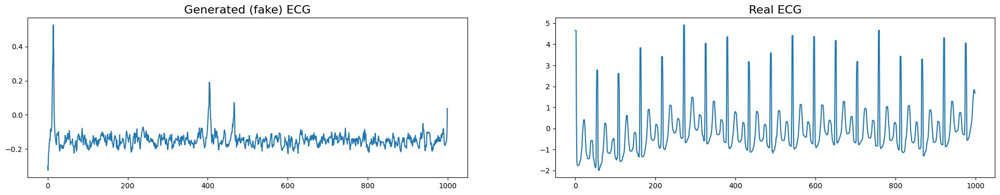

Epoch 1471/3000
Generator loss: 2.660830020904541
Discriminator loss: 166776896.0
-------------------
Epoch 1472/3000
Generator loss: 2.499768018722534
Discriminator loss: 175167120.0
-------------------
Epoch 1473/3000
Generator loss: 2.6858837604522705
Discriminator loss: 178726784.0
-------------------
Epoch 1474/3000
Generator loss: 2.650801658630371
Discriminator loss: 170155392.0
-------------------
Epoch 1475/3000
Generator loss: 2.5910580158233643
Discriminator loss: 173209280.0
-------------------
Epoch 1476/3000
Generator loss: 2.564972400665283
Discriminator loss: 172183536.0
-------------------
Epoch 1477/3000
Generator loss: 2.663083076477051
Discriminator loss: 177000512.0
-------------------
Epoch 1478/3000
Generator loss: 2.5879101753234863
Discriminator loss: 175003520.0
-------------------
Epoch 1479/3000
Generator loss: 2.7831249237060547
Discriminator loss: 176770272.0
-------------------
Epoch 1480/3000
Generator loss: 2.617900848388672
Discriminator loss: 17838150

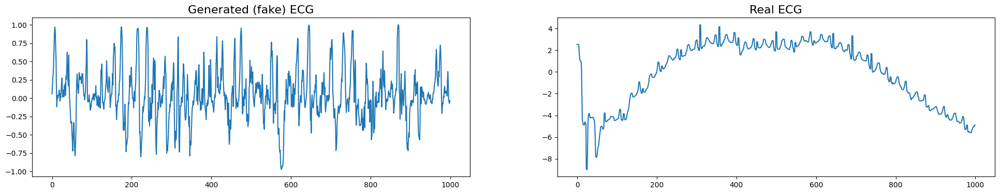

Epoch 1501/3000
Generator loss: 2.664926052093506
Discriminator loss: 184125088.0
-------------------
Epoch 1502/3000
Generator loss: 2.66613507270813
Discriminator loss: 176974736.0
-------------------
Epoch 1503/3000
Generator loss: 2.6687464714050293
Discriminator loss: 174390848.0
-------------------
Epoch 1504/3000
Generator loss: 2.6063179969787598
Discriminator loss: 171182768.0
-------------------
Epoch 1505/3000
Generator loss: 2.6300811767578125
Discriminator loss: 182658928.0
-------------------
Epoch 1506/3000
Generator loss: 2.674914598464966
Discriminator loss: 174891680.0
-------------------
Epoch 1507/3000
Generator loss: 2.5881571769714355
Discriminator loss: 172356464.0
-------------------
Epoch 1508/3000
Generator loss: 2.713043212890625
Discriminator loss: 181136608.0
-------------------
Epoch 1509/3000
Generator loss: 2.616013765335083
Discriminator loss: 176176032.0
-------------------
Epoch 1510/3000
Generator loss: 2.6932103633880615
Discriminator loss: 18140336

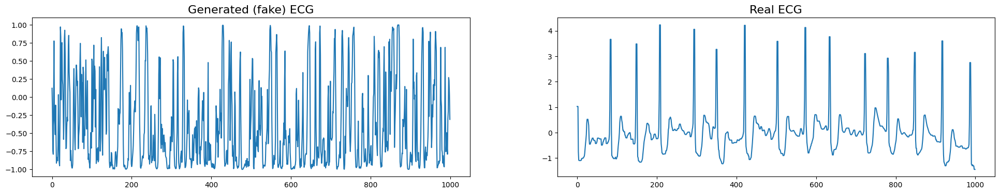

Epoch 1531/3000
Generator loss: 2.6697487831115723
Discriminator loss: 179969968.0
-------------------
Epoch 1532/3000
Generator loss: 2.7616658210754395
Discriminator loss: 175726128.0
-------------------
Epoch 1533/3000
Generator loss: 2.606670379638672
Discriminator loss: 170877632.0
-------------------
Epoch 1534/3000
Generator loss: 2.816474437713623
Discriminator loss: 172654336.0
-------------------
Epoch 1535/3000
Generator loss: 2.560690402984619
Discriminator loss: 182804816.0
-------------------
Epoch 1536/3000
Generator loss: 2.6330740451812744
Discriminator loss: 177224144.0
-------------------
Epoch 1537/3000
Generator loss: 2.638223648071289
Discriminator loss: 182097952.0
-------------------
Epoch 1538/3000
Generator loss: 2.6314918994903564
Discriminator loss: 179756208.0
-------------------
Epoch 1539/3000
Generator loss: 2.6748669147491455
Discriminator loss: 173370960.0
-------------------
Epoch 1540/3000
Generator loss: 2.684232234954834
Discriminator loss: 1697068

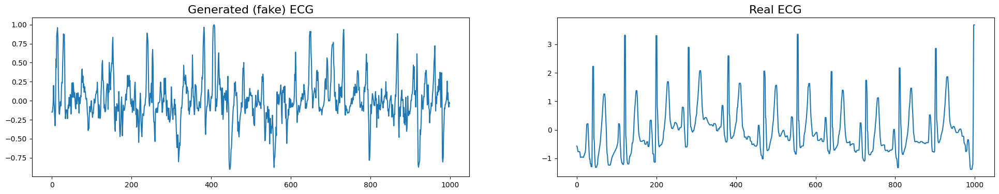

Epoch 1561/3000
Generator loss: 2.5173227787017822
Discriminator loss: 172357792.0
-------------------
Epoch 1562/3000
Generator loss: 2.693027973175049
Discriminator loss: 174909248.0
-------------------
Epoch 1563/3000
Generator loss: 2.612765073776245
Discriminator loss: 178010544.0
-------------------
Epoch 1564/3000
Generator loss: 2.689383029937744
Discriminator loss: 186342112.0
-------------------
Epoch 1565/3000
Generator loss: 2.5301148891448975
Discriminator loss: 187999632.0
-------------------
Epoch 1566/3000
Generator loss: 2.5684404373168945
Discriminator loss: 174271360.0
-------------------
Epoch 1567/3000
Generator loss: 2.5130503177642822
Discriminator loss: 183077424.0
-------------------
Epoch 1568/3000
Generator loss: 2.6700925827026367
Discriminator loss: 183580000.0
-------------------
Epoch 1569/3000
Generator loss: 2.5608890056610107
Discriminator loss: 182491728.0
-------------------
Epoch 1570/3000
Generator loss: 2.6213619709014893
Discriminator loss: 18931

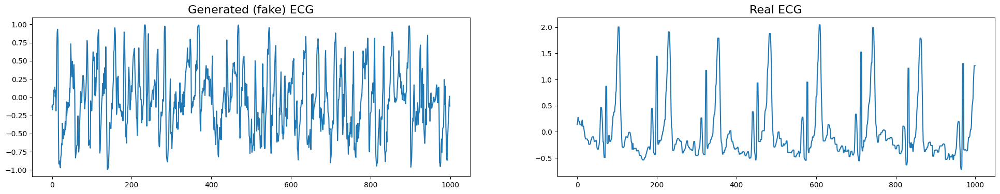

Epoch 1591/3000
Generator loss: 2.541719436645508
Discriminator loss: 179476896.0
-------------------
Epoch 1592/3000
Generator loss: 2.637814998626709
Discriminator loss: 179330528.0
-------------------
Epoch 1593/3000
Generator loss: 2.7368319034576416
Discriminator loss: 180279408.0
-------------------
Epoch 1594/3000
Generator loss: 2.570896625518799
Discriminator loss: 178676992.0
-------------------
Epoch 1595/3000
Generator loss: 2.6958608627319336
Discriminator loss: 172487568.0
-------------------
Epoch 1596/3000
Generator loss: 2.570448875427246
Discriminator loss: 182854752.0
-------------------
Epoch 1597/3000
Generator loss: 2.650864839553833
Discriminator loss: 182036576.0
-------------------
Epoch 1598/3000
Generator loss: 2.6528868675231934
Discriminator loss: 179064288.0
-------------------
Epoch 1599/3000
Generator loss: 2.5850391387939453
Discriminator loss: 172425392.0
-------------------
Epoch 1600/3000
Generator loss: 2.795541524887085
Discriminator loss: 17745681

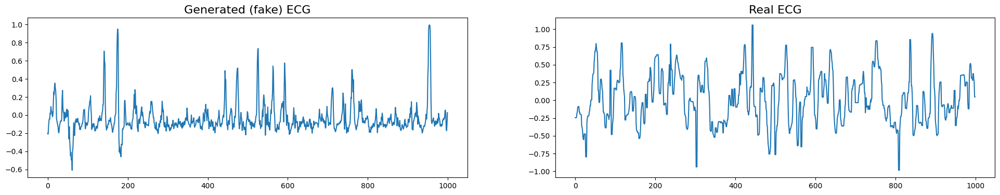

Epoch 1621/3000
Generator loss: 2.6941845417022705
Discriminator loss: 186410624.0
-------------------
Epoch 1622/3000
Generator loss: 2.69144868850708
Discriminator loss: 171877504.0
-------------------
Epoch 1623/3000
Generator loss: 2.6283206939697266
Discriminator loss: 184813520.0
-------------------
Epoch 1624/3000
Generator loss: 2.571775436401367
Discriminator loss: 182368672.0
-------------------
Epoch 1625/3000
Generator loss: 2.5759758949279785
Discriminator loss: 174756432.0
-------------------
Epoch 1626/3000
Generator loss: 2.612389087677002
Discriminator loss: 183314656.0
-------------------
Epoch 1627/3000
Generator loss: 2.55704927444458
Discriminator loss: 176665344.0
-------------------
Epoch 1628/3000
Generator loss: 2.5857112407684326
Discriminator loss: 179683136.0
-------------------
Epoch 1629/3000
Generator loss: 2.7600607872009277
Discriminator loss: 175939648.0
-------------------
Epoch 1630/3000
Generator loss: 2.640808582305908
Discriminator loss: 176471264

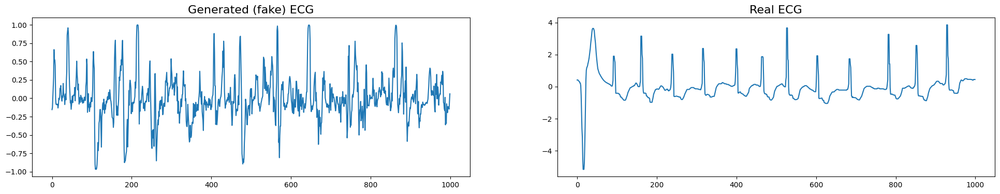

Epoch 1651/3000
Generator loss: 2.5904908180236816
Discriminator loss: 181008288.0
-------------------
Epoch 1652/3000
Generator loss: 2.6430063247680664
Discriminator loss: 169561280.0
-------------------
Epoch 1653/3000
Generator loss: 2.6099677085876465
Discriminator loss: 185831984.0
-------------------
Epoch 1654/3000
Generator loss: 2.638028621673584
Discriminator loss: 185159264.0
-------------------
Epoch 1655/3000
Generator loss: 2.5182323455810547
Discriminator loss: 177712176.0
-------------------
Epoch 1656/3000
Generator loss: 2.5545592308044434
Discriminator loss: 176995904.0
-------------------
Epoch 1657/3000
Generator loss: 2.550344467163086
Discriminator loss: 174403328.0
-------------------
Epoch 1658/3000
Generator loss: 2.669215679168701
Discriminator loss: 175517360.0
-------------------
Epoch 1659/3000
Generator loss: 2.7422947883605957
Discriminator loss: 176187600.0
-------------------
Epoch 1660/3000
Generator loss: 2.6374948024749756
Discriminator loss: 17531

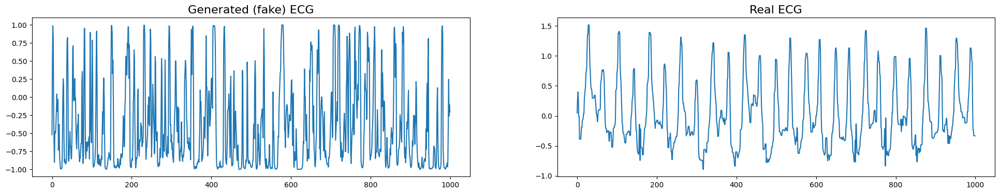

Epoch 1681/3000
Generator loss: 2.5709118843078613
Discriminator loss: 184464288.0
-------------------
Epoch 1682/3000
Generator loss: 2.6351003646850586
Discriminator loss: 169719136.0
-------------------
Epoch 1683/3000
Generator loss: 2.6038570404052734
Discriminator loss: 179591104.0
-------------------
Epoch 1684/3000
Generator loss: 2.585543155670166
Discriminator loss: 178559552.0
-------------------
Epoch 1685/3000
Generator loss: 2.589160680770874
Discriminator loss: 183469616.0
-------------------
Epoch 1686/3000
Generator loss: 2.619633913040161
Discriminator loss: 169687552.0
-------------------
Epoch 1687/3000
Generator loss: 2.6184353828430176
Discriminator loss: 178832896.0
-------------------
Epoch 1688/3000
Generator loss: 2.5707783699035645
Discriminator loss: 182128896.0
-------------------
Epoch 1689/3000
Generator loss: 2.6516318321228027
Discriminator loss: 177800608.0
-------------------
Epoch 1690/3000
Generator loss: 2.689728021621704
Discriminator loss: 170627

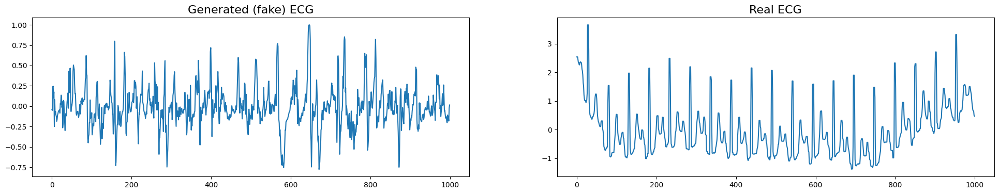

Epoch 1711/3000
Generator loss: 2.5642809867858887
Discriminator loss: 171588768.0
-------------------
Epoch 1712/3000
Generator loss: 2.680098056793213
Discriminator loss: 181922864.0
-------------------
Epoch 1713/3000
Generator loss: 2.5932962894439697
Discriminator loss: 179459552.0
-------------------
Epoch 1714/3000
Generator loss: 2.620725154876709
Discriminator loss: 177210736.0
-------------------
Epoch 1715/3000
Generator loss: 2.657787322998047
Discriminator loss: 178186880.0
-------------------
Epoch 1716/3000
Generator loss: 2.682187557220459
Discriminator loss: 165483536.0
-------------------
Epoch 1717/3000
Generator loss: 2.6501526832580566
Discriminator loss: 175233472.0
-------------------
Epoch 1718/3000
Generator loss: 2.59088134765625
Discriminator loss: 172433600.0
-------------------
Epoch 1719/3000
Generator loss: 2.6045119762420654
Discriminator loss: 186043920.0
-------------------
Epoch 1720/3000
Generator loss: 2.618931293487549
Discriminator loss: 177488368

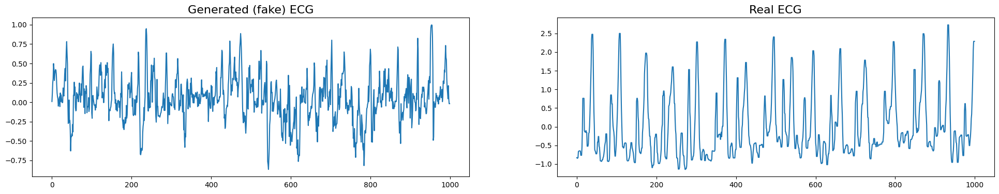

Epoch 1741/3000
Generator loss: 2.6335673332214355
Discriminator loss: 178917552.0
-------------------
Epoch 1742/3000
Generator loss: 2.491041898727417
Discriminator loss: 183247008.0
-------------------
Epoch 1743/3000
Generator loss: 2.5740580558776855
Discriminator loss: 182465056.0
-------------------
Epoch 1744/3000
Generator loss: 2.5101702213287354
Discriminator loss: 174969104.0
-------------------
Epoch 1745/3000
Generator loss: 2.5656545162200928
Discriminator loss: 180949376.0
-------------------
Epoch 1746/3000
Generator loss: 2.567485809326172
Discriminator loss: 177527648.0
-------------------
Epoch 1747/3000
Generator loss: 2.6743578910827637
Discriminator loss: 180614816.0
-------------------
Epoch 1748/3000
Generator loss: 2.667055130004883
Discriminator loss: 169304480.0
-------------------
Epoch 1749/3000
Generator loss: 2.6709132194519043
Discriminator loss: 172345712.0
-------------------
Epoch 1750/3000
Generator loss: 2.6895413398742676
Discriminator loss: 18270

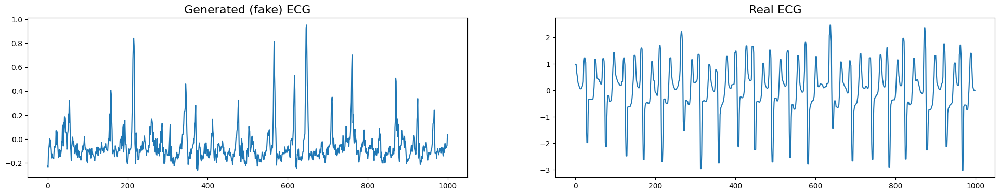

Epoch 1771/3000
Generator loss: 2.587907552719116
Discriminator loss: 184680736.0
-------------------
Epoch 1772/3000
Generator loss: 2.5887813568115234
Discriminator loss: 177964288.0
-------------------
Epoch 1773/3000
Generator loss: 2.5639302730560303
Discriminator loss: 173698128.0
-------------------
Epoch 1774/3000
Generator loss: 2.576941967010498
Discriminator loss: 190093712.0
-------------------
Epoch 1775/3000
Generator loss: 2.648240566253662
Discriminator loss: 181462464.0
-------------------
Epoch 1776/3000
Generator loss: 2.6216163635253906
Discriminator loss: 185304096.0
-------------------
Epoch 1777/3000
Generator loss: 2.6609230041503906
Discriminator loss: 176174048.0
-------------------
Epoch 1778/3000
Generator loss: 2.73354172706604
Discriminator loss: 176967584.0
-------------------
Epoch 1779/3000
Generator loss: 2.683600664138794
Discriminator loss: 173325088.0
-------------------
Epoch 1780/3000
Generator loss: 2.533377170562744
Discriminator loss: 179660672

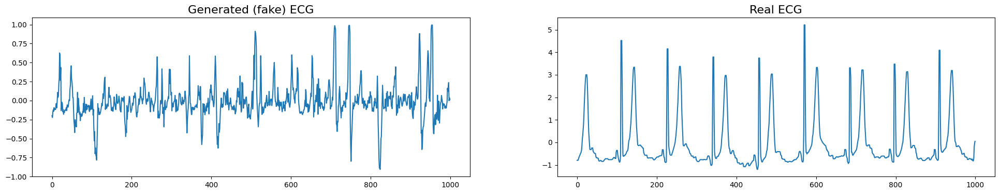

Epoch 1801/3000
Generator loss: 2.648054838180542
Discriminator loss: 164859744.0
-------------------
Epoch 1802/3000
Generator loss: 2.6020467281341553
Discriminator loss: 174194544.0
-------------------
Epoch 1803/3000
Generator loss: 2.6539692878723145
Discriminator loss: 172958080.0
-------------------
Epoch 1804/3000
Generator loss: 2.658313751220703
Discriminator loss: 183283872.0
-------------------
Epoch 1805/3000
Generator loss: 2.6976852416992188
Discriminator loss: 177398544.0
-------------------
Epoch 1806/3000
Generator loss: 2.6645431518554688
Discriminator loss: 176171936.0
-------------------
Epoch 1807/3000
Generator loss: 2.683741569519043
Discriminator loss: 181059008.0
-------------------
Epoch 1808/3000
Generator loss: 2.6045820713043213
Discriminator loss: 174880000.0
-------------------
Epoch 1809/3000
Generator loss: 2.644826889038086
Discriminator loss: 178999456.0
-------------------
Epoch 1810/3000
Generator loss: 2.529982089996338
Discriminator loss: 1821223

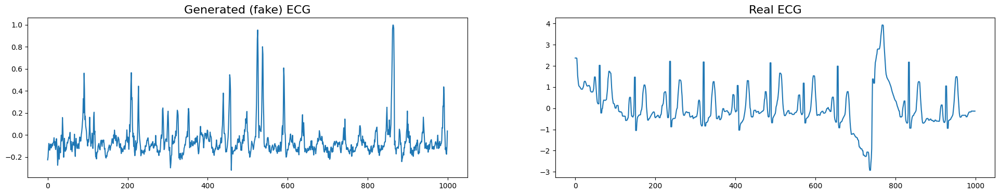

Epoch 1831/3000
Generator loss: 2.630601167678833
Discriminator loss: 178972192.0
-------------------
Epoch 1832/3000
Generator loss: 2.648615837097168
Discriminator loss: 176390176.0
-------------------
Epoch 1833/3000
Generator loss: 2.6276984214782715
Discriminator loss: 161354304.0
-------------------
Epoch 1834/3000
Generator loss: 2.666599750518799
Discriminator loss: 172851616.0
-------------------
Epoch 1835/3000
Generator loss: 2.600522518157959
Discriminator loss: 176493840.0
-------------------
Epoch 1836/3000
Generator loss: 2.6984477043151855
Discriminator loss: 174510832.0
-------------------
Epoch 1837/3000
Generator loss: 2.5810134410858154
Discriminator loss: 184165344.0
-------------------
Epoch 1838/3000
Generator loss: 2.678051471710205
Discriminator loss: 175886592.0
-------------------
Epoch 1839/3000
Generator loss: 2.509873867034912
Discriminator loss: 174180528.0
-------------------
Epoch 1840/3000
Generator loss: 2.6568710803985596
Discriminator loss: 18480372

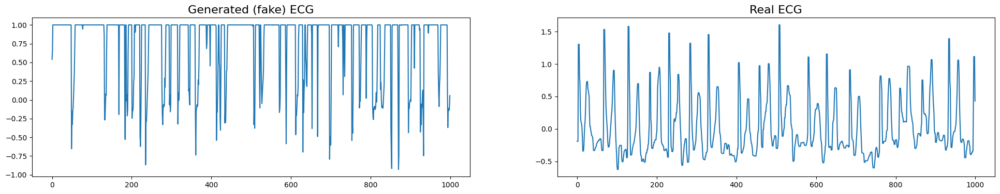

Epoch 1861/3000
Generator loss: 2.5815744400024414
Discriminator loss: 174996576.0
-------------------
Epoch 1862/3000
Generator loss: 2.6139230728149414
Discriminator loss: 179189984.0
-------------------
Epoch 1863/3000
Generator loss: 2.602330207824707
Discriminator loss: 178605120.0
-------------------
Epoch 1864/3000
Generator loss: 2.5167574882507324
Discriminator loss: 184662624.0
-------------------
Epoch 1865/3000
Generator loss: 2.5885510444641113
Discriminator loss: 185776224.0
-------------------
Epoch 1866/3000
Generator loss: 2.6037662029266357
Discriminator loss: 181976688.0
-------------------
Epoch 1867/3000
Generator loss: 2.764796257019043
Discriminator loss: 173718016.0
-------------------
Epoch 1868/3000
Generator loss: 2.5582308769226074
Discriminator loss: 181713360.0
-------------------
Epoch 1869/3000
Generator loss: 2.497382879257202
Discriminator loss: 178664208.0
-------------------
Epoch 1870/3000
Generator loss: 2.6023526191711426
Discriminator loss: 17985

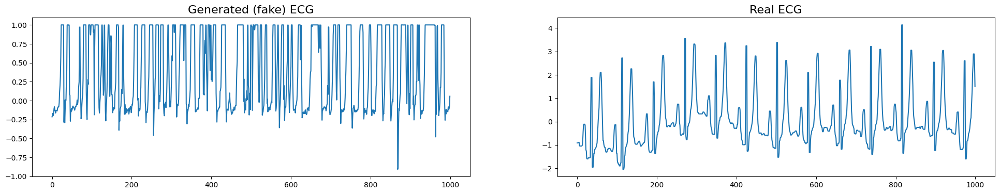

Epoch 1891/3000
Generator loss: 2.694735288619995
Discriminator loss: 181238336.0
-------------------
Epoch 1892/3000
Generator loss: 2.640582799911499
Discriminator loss: 180457296.0
-------------------
Epoch 1893/3000
Generator loss: 2.60009503364563
Discriminator loss: 169241280.0
-------------------
Epoch 1894/3000
Generator loss: 2.7316370010375977
Discriminator loss: 175051744.0
-------------------
Epoch 1895/3000
Generator loss: 2.645167350769043
Discriminator loss: 176362400.0
-------------------
Epoch 1896/3000
Generator loss: 2.659153938293457
Discriminator loss: 171747840.0
-------------------
Epoch 1897/3000
Generator loss: 2.7339258193969727
Discriminator loss: 173742272.0
-------------------
Epoch 1898/3000
Generator loss: 2.59462571144104
Discriminator loss: 172080128.0
-------------------
Epoch 1899/3000
Generator loss: 2.636579990386963
Discriminator loss: 181462896.0
-------------------
Epoch 1900/3000
Generator loss: 2.873276710510254
Discriminator loss: 166722704.0


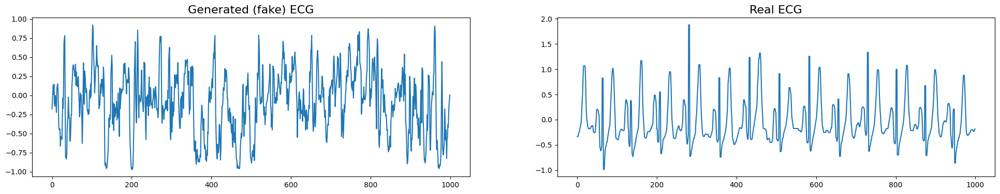

Epoch 1921/3000
Generator loss: 2.571321964263916
Discriminator loss: 182911648.0
-------------------
Epoch 1922/3000
Generator loss: 2.5679492950439453
Discriminator loss: 171178272.0
-------------------
Epoch 1923/3000
Generator loss: 2.6682097911834717
Discriminator loss: 171677312.0
-------------------
Epoch 1924/3000
Generator loss: 2.5778329372406006
Discriminator loss: 175332640.0
-------------------
Epoch 1925/3000
Generator loss: 2.5995402336120605
Discriminator loss: 186650336.0
-------------------
Epoch 1926/3000
Generator loss: 2.711787223815918
Discriminator loss: 178742864.0
-------------------
Epoch 1927/3000
Generator loss: 2.69777774810791
Discriminator loss: 180988496.0
-------------------
Epoch 1928/3000
Generator loss: 2.598534345626831
Discriminator loss: 171015872.0
-------------------
Epoch 1929/3000
Generator loss: 2.684788227081299
Discriminator loss: 177279904.0
-------------------
Epoch 1930/3000
Generator loss: 2.5566487312316895
Discriminator loss: 17371086

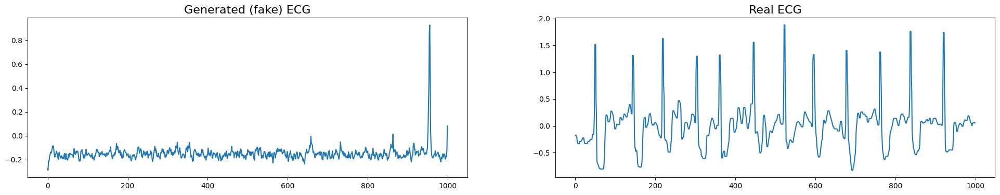

Epoch 1951/3000
Generator loss: 2.6636273860931396
Discriminator loss: 170306608.0
-------------------
Epoch 1952/3000
Generator loss: 2.6108570098876953
Discriminator loss: 176995968.0
-------------------
Epoch 1953/3000
Generator loss: 2.636354684829712
Discriminator loss: 169198304.0
-------------------
Epoch 1954/3000
Generator loss: 2.6871957778930664
Discriminator loss: 172951328.0
-------------------
Epoch 1955/3000
Generator loss: 2.6813454627990723
Discriminator loss: 179441792.0
-------------------
Epoch 1956/3000
Generator loss: 2.6946563720703125
Discriminator loss: 173670528.0
-------------------
Epoch 1957/3000
Generator loss: 2.5767290592193604
Discriminator loss: 179750112.0
-------------------
Epoch 1958/3000
Generator loss: 2.6280131340026855
Discriminator loss: 174393184.0
-------------------
Epoch 1959/3000
Generator loss: 2.5151381492614746
Discriminator loss: 183174560.0
-------------------
Epoch 1960/3000
Generator loss: 2.5838074684143066
Discriminator loss: 170

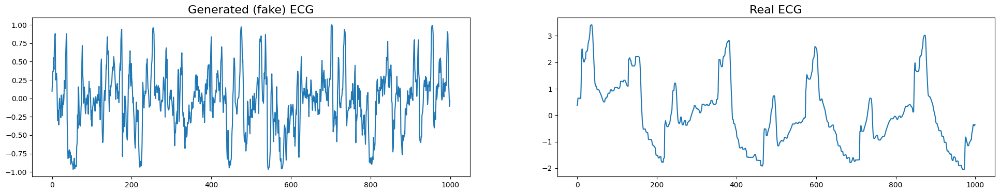

Epoch 1981/3000
Generator loss: 2.650460720062256
Discriminator loss: 171256576.0
-------------------
Epoch 1982/3000
Generator loss: 2.627359390258789
Discriminator loss: 170964768.0
-------------------
Epoch 1983/3000
Generator loss: 2.6584420204162598
Discriminator loss: 170869104.0
-------------------
Epoch 1984/3000
Generator loss: 2.6580443382263184
Discriminator loss: 179557488.0
-------------------
Epoch 1985/3000
Generator loss: 2.711207866668701
Discriminator loss: 169330816.0
-------------------
Epoch 1986/3000
Generator loss: 2.5362548828125
Discriminator loss: 171740064.0
-------------------
Epoch 1987/3000
Generator loss: 2.54961895942688
Discriminator loss: 178261504.0
-------------------
Epoch 1988/3000
Generator loss: 2.639077663421631
Discriminator loss: 180676560.0
-------------------
Epoch 1989/3000
Generator loss: 2.6035923957824707
Discriminator loss: 167313920.0
-------------------
Epoch 1990/3000
Generator loss: 2.5677266120910645
Discriminator loss: 175095552.0

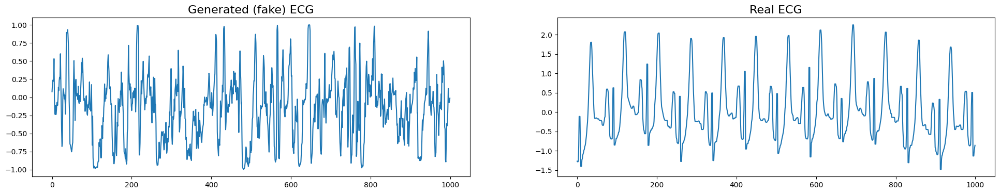

Epoch 2011/3000
Generator loss: 2.638331651687622
Discriminator loss: 166546672.0
-------------------
Epoch 2012/3000
Generator loss: 2.598690986633301
Discriminator loss: 170523408.0
-------------------
Epoch 2013/3000
Generator loss: 2.5455260276794434
Discriminator loss: 174775104.0
-------------------
Epoch 2014/3000
Generator loss: 2.5681216716766357
Discriminator loss: 175922240.0
-------------------
Epoch 2015/3000
Generator loss: 2.532358407974243
Discriminator loss: 175499776.0
-------------------
Epoch 2016/3000
Generator loss: 2.6505792140960693
Discriminator loss: 179548432.0
-------------------
Epoch 2017/3000
Generator loss: 2.619098424911499
Discriminator loss: 179550384.0
-------------------
Epoch 2018/3000
Generator loss: 2.624382495880127
Discriminator loss: 175435264.0
-------------------
Epoch 2019/3000
Generator loss: 2.6303935050964355
Discriminator loss: 180712704.0
-------------------
Epoch 2020/3000
Generator loss: 2.610508441925049
Discriminator loss: 18547886

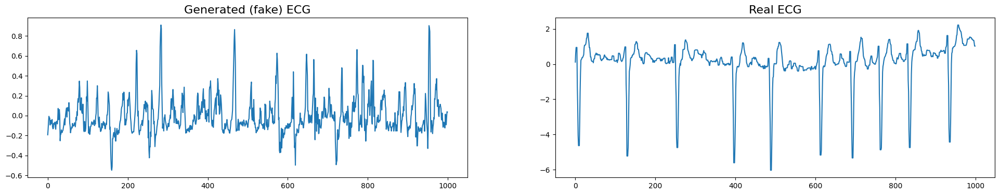

Epoch 2041/3000
Generator loss: 2.5929360389709473
Discriminator loss: 177806304.0
-------------------
Epoch 2042/3000
Generator loss: 2.659632444381714
Discriminator loss: 176615680.0
-------------------
Epoch 2043/3000
Generator loss: 2.638246536254883
Discriminator loss: 181886464.0
-------------------
Epoch 2044/3000
Generator loss: 2.60105562210083
Discriminator loss: 181388752.0
-------------------
Epoch 2045/3000
Generator loss: 2.5522079467773438
Discriminator loss: 182084464.0
-------------------
Epoch 2046/3000
Generator loss: 2.650967836380005
Discriminator loss: 179738496.0
-------------------
Epoch 2047/3000
Generator loss: 2.784864902496338
Discriminator loss: 176987488.0
-------------------
Epoch 2048/3000
Generator loss: 2.6796140670776367
Discriminator loss: 178517408.0
-------------------
Epoch 2049/3000
Generator loss: 2.6462299823760986
Discriminator loss: 176883296.0
-------------------
Epoch 2050/3000
Generator loss: 2.649111747741699
Discriminator loss: 177245776

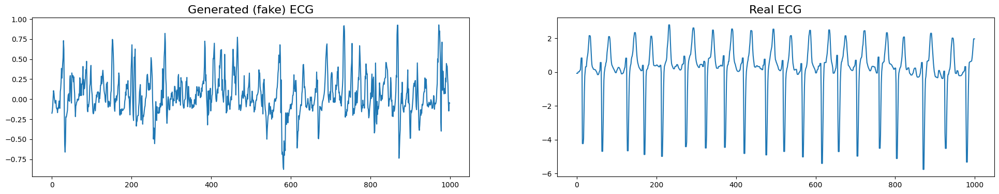

Epoch 2071/3000
Generator loss: 2.676888942718506
Discriminator loss: 176335072.0
-------------------
Epoch 2072/3000
Generator loss: 2.561326742172241
Discriminator loss: 176243856.0
-------------------
Epoch 2073/3000
Generator loss: 2.5516462326049805
Discriminator loss: 177802144.0
-------------------
Epoch 2074/3000
Generator loss: 2.7133467197418213
Discriminator loss: 175679136.0
-------------------
Epoch 2075/3000
Generator loss: 2.736553192138672
Discriminator loss: 179061056.0
-------------------
Epoch 2076/3000
Generator loss: 2.669095516204834
Discriminator loss: 171685296.0
-------------------
Epoch 2077/3000
Generator loss: 2.5904178619384766
Discriminator loss: 179534912.0
-------------------
Epoch 2078/3000
Generator loss: 2.646918296813965
Discriminator loss: 176096464.0
-------------------
Epoch 2079/3000
Generator loss: 2.543898582458496
Discriminator loss: 176432592.0
-------------------
Epoch 2080/3000
Generator loss: 2.575819253921509
Discriminator loss: 182333344

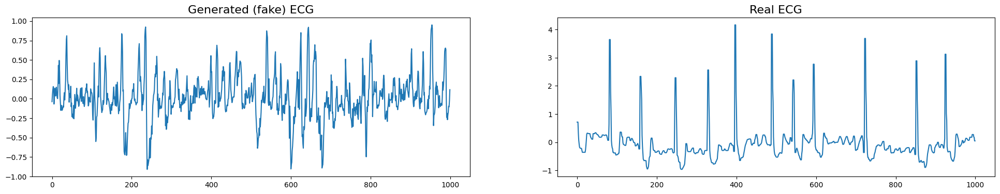

Epoch 2101/3000
Generator loss: 2.6178245544433594
Discriminator loss: 175694880.0
-------------------
Epoch 2102/3000
Generator loss: 2.639101505279541
Discriminator loss: 173785920.0
-------------------
Epoch 2103/3000
Generator loss: 2.5599775314331055
Discriminator loss: 180999200.0
-------------------
Epoch 2104/3000
Generator loss: 2.7175629138946533
Discriminator loss: 174844576.0
-------------------
Epoch 2105/3000
Generator loss: 2.643423557281494
Discriminator loss: 176728960.0
-------------------
Epoch 2106/3000
Generator loss: 2.6017253398895264
Discriminator loss: 173556144.0
-------------------
Epoch 2107/3000
Generator loss: 2.6011064052581787
Discriminator loss: 176632672.0
-------------------
Epoch 2108/3000
Generator loss: 2.6770005226135254
Discriminator loss: 172521552.0
-------------------
Epoch 2109/3000
Generator loss: 2.617316722869873
Discriminator loss: 184599984.0
-------------------
Epoch 2110/3000
Generator loss: 2.73506498336792
Discriminator loss: 1778319

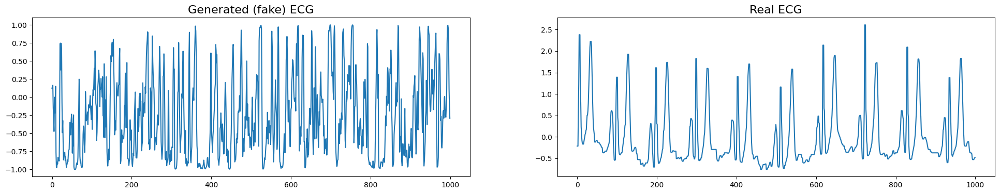

Epoch 2131/3000
Generator loss: 2.583557605743408
Discriminator loss: 176635744.0
-------------------
Epoch 2132/3000
Generator loss: 2.685762405395508
Discriminator loss: 179860544.0
-------------------
Epoch 2133/3000
Generator loss: 2.558412551879883
Discriminator loss: 181101536.0
-------------------
Epoch 2134/3000
Generator loss: 2.67842698097229
Discriminator loss: 180375760.0
-------------------
Epoch 2135/3000
Generator loss: 2.588674783706665
Discriminator loss: 178891408.0
-------------------
Epoch 2136/3000
Generator loss: 2.589433431625366
Discriminator loss: 180213248.0
-------------------
Epoch 2137/3000
Generator loss: 2.6014657020568848
Discriminator loss: 189494080.0
-------------------
Epoch 2138/3000
Generator loss: 2.6046555042266846
Discriminator loss: 176869344.0
-------------------
Epoch 2139/3000
Generator loss: 2.662952423095703
Discriminator loss: 174418336.0
-------------------
Epoch 2140/3000
Generator loss: 2.716334342956543
Discriminator loss: 176996912.0

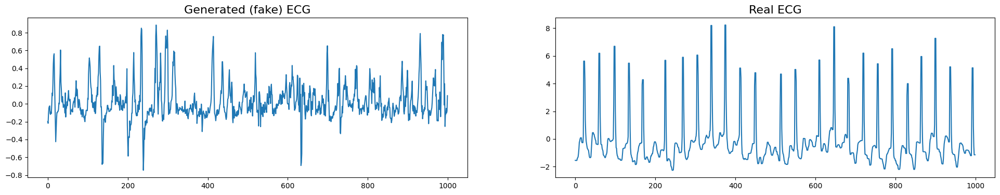

Epoch 2161/3000
Generator loss: 2.681204319000244
Discriminator loss: 175144864.0
-------------------
Epoch 2162/3000
Generator loss: 2.5965933799743652
Discriminator loss: 178190560.0
-------------------
Epoch 2163/3000
Generator loss: 2.678588390350342
Discriminator loss: 175458576.0
-------------------
Epoch 2164/3000
Generator loss: 2.6082377433776855
Discriminator loss: 174404400.0
-------------------
Epoch 2165/3000
Generator loss: 2.6845881938934326
Discriminator loss: 175022000.0
-------------------
Epoch 2166/3000
Generator loss: 2.698800563812256
Discriminator loss: 172785888.0
-------------------
Epoch 2167/3000
Generator loss: 2.6954102516174316
Discriminator loss: 182436032.0
-------------------
Epoch 2168/3000
Generator loss: 2.6259231567382812
Discriminator loss: 186062144.0
-------------------
Epoch 2169/3000
Generator loss: 2.760490894317627
Discriminator loss: 169451120.0
-------------------
Epoch 2170/3000
Generator loss: 2.57388973236084
Discriminator loss: 17646881

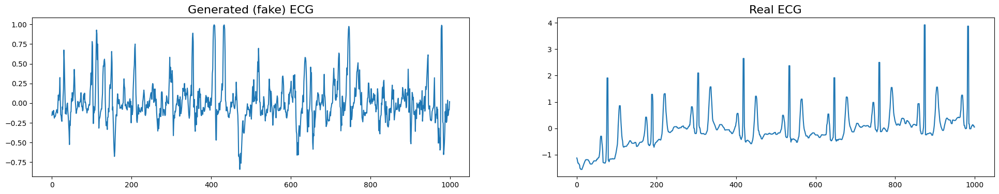

Epoch 2191/3000
Generator loss: 2.5245232582092285
Discriminator loss: 180298880.0
-------------------
Epoch 2192/3000
Generator loss: 2.7311019897460938
Discriminator loss: 181300400.0
-------------------
Epoch 2193/3000
Generator loss: 2.5621213912963867
Discriminator loss: 175993360.0
-------------------
Epoch 2194/3000
Generator loss: 2.64851975440979
Discriminator loss: 177819872.0
-------------------
Epoch 2195/3000
Generator loss: 2.628326177597046
Discriminator loss: 179950080.0
-------------------
Epoch 2196/3000
Generator loss: 2.563488006591797
Discriminator loss: 179709232.0
-------------------
Epoch 2197/3000
Generator loss: 2.627554416656494
Discriminator loss: 178196496.0
-------------------
Epoch 2198/3000
Generator loss: 2.640442371368408
Discriminator loss: 176599744.0
-------------------
Epoch 2199/3000
Generator loss: 2.6147403717041016
Discriminator loss: 179172160.0
-------------------
Epoch 2200/3000
Generator loss: 2.5767316818237305
Discriminator loss: 18535425

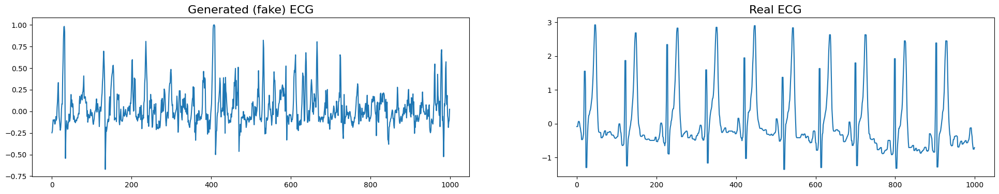

Epoch 2221/3000
Generator loss: 2.574647903442383
Discriminator loss: 182605808.0
-------------------
Epoch 2222/3000
Generator loss: 2.6097819805145264
Discriminator loss: 173876976.0
-------------------
Epoch 2223/3000
Generator loss: 2.622612953186035
Discriminator loss: 177082000.0
-------------------
Epoch 2224/3000
Generator loss: 2.60252046585083
Discriminator loss: 177833008.0
-------------------
Epoch 2225/3000
Generator loss: 2.6360974311828613
Discriminator loss: 180334624.0
-------------------
Epoch 2226/3000
Generator loss: 2.615817070007324
Discriminator loss: 174147824.0
-------------------
Epoch 2227/3000
Generator loss: 2.5652260780334473
Discriminator loss: 171773648.0
-------------------
Epoch 2228/3000
Generator loss: 2.717893600463867
Discriminator loss: 178283680.0
-------------------
Epoch 2229/3000
Generator loss: 2.587747573852539
Discriminator loss: 185409856.0
-------------------
Epoch 2230/3000
Generator loss: 2.5424342155456543
Discriminator loss: 168600096

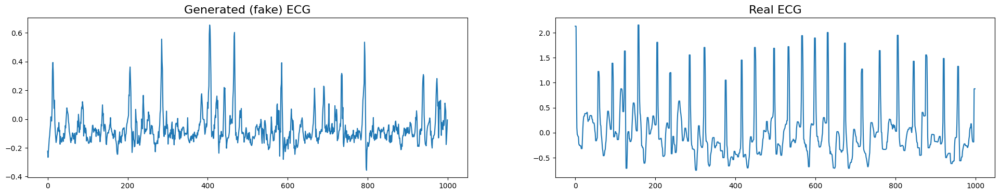

Epoch 2251/3000
Generator loss: 2.7384514808654785
Discriminator loss: 174768032.0
-------------------
Epoch 2252/3000
Generator loss: 2.7120628356933594
Discriminator loss: 174479936.0
-------------------
Epoch 2253/3000
Generator loss: 2.621181011199951
Discriminator loss: 182572208.0
-------------------
Epoch 2254/3000
Generator loss: 2.580920696258545
Discriminator loss: 173965184.0
-------------------
Epoch 2255/3000
Generator loss: 2.6222498416900635
Discriminator loss: 179444704.0
-------------------
Epoch 2256/3000
Generator loss: 2.705812931060791
Discriminator loss: 184077440.0
-------------------
Epoch 2257/3000
Generator loss: 2.6088309288024902
Discriminator loss: 180317696.0
-------------------
Epoch 2258/3000
Generator loss: 2.530421257019043
Discriminator loss: 178924592.0
-------------------
Epoch 2259/3000
Generator loss: 2.41843318939209
Discriminator loss: 174966256.0
-------------------
Epoch 2260/3000
Generator loss: 2.632741689682007
Discriminator loss: 178439728

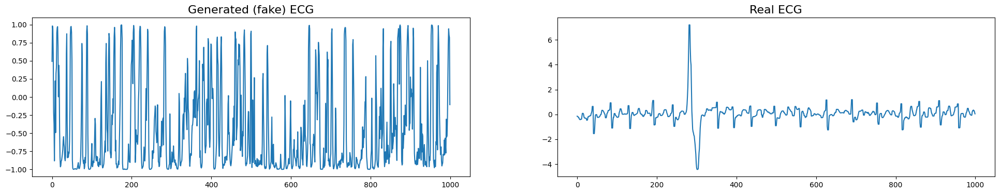

Epoch 2281/3000
Generator loss: 2.710942506790161
Discriminator loss: 178575712.0
-------------------
Epoch 2282/3000
Generator loss: 2.5334339141845703
Discriminator loss: 182488384.0
-------------------
Epoch 2283/3000
Generator loss: 2.5919692516326904
Discriminator loss: 167740928.0
-------------------
Epoch 2284/3000
Generator loss: 2.646822929382324
Discriminator loss: 171565536.0
-------------------
Epoch 2285/3000
Generator loss: 2.413090229034424
Discriminator loss: 166534672.0
-------------------
Epoch 2286/3000
Generator loss: 2.701268196105957
Discriminator loss: 185891648.0
-------------------
Epoch 2287/3000
Generator loss: 2.590115547180176
Discriminator loss: 174195104.0
-------------------
Epoch 2288/3000
Generator loss: 2.6590983867645264
Discriminator loss: 176542864.0
-------------------
Epoch 2289/3000
Generator loss: 2.5628676414489746
Discriminator loss: 176460224.0
-------------------
Epoch 2290/3000
Generator loss: 2.5881998538970947
Discriminator loss: 1876761

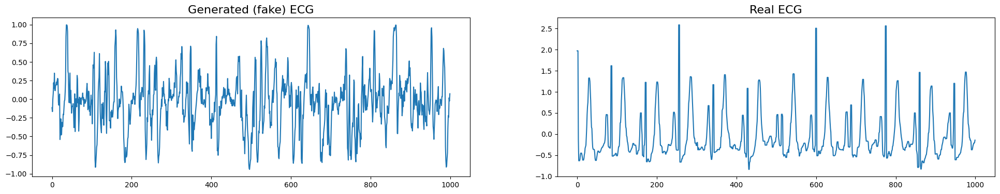

Epoch 2311/3000
Generator loss: 2.609654664993286
Discriminator loss: 182602320.0
-------------------
Epoch 2312/3000
Generator loss: 2.6602871417999268
Discriminator loss: 176626608.0
-------------------
Epoch 2313/3000
Generator loss: 2.5799670219421387
Discriminator loss: 182606576.0
-------------------
Epoch 2314/3000
Generator loss: 2.723344326019287
Discriminator loss: 175592032.0
-------------------
Epoch 2315/3000
Generator loss: 2.451256275177002
Discriminator loss: 191871328.0
-------------------
Epoch 2316/3000
Generator loss: 2.6886441707611084
Discriminator loss: 174638304.0
-------------------
Epoch 2317/3000
Generator loss: 2.587817668914795
Discriminator loss: 183974240.0
-------------------
Epoch 2318/3000
Generator loss: 2.6951332092285156
Discriminator loss: 173652048.0
-------------------
Epoch 2319/3000
Generator loss: 2.6645584106445312
Discriminator loss: 176543488.0
-------------------
Epoch 2320/3000
Generator loss: 2.65560245513916
Discriminator loss: 17343228

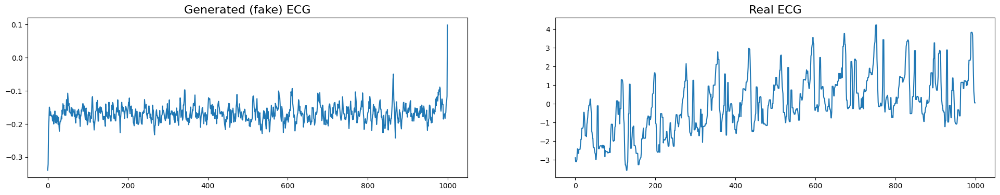

Epoch 2341/3000
Generator loss: 2.710606575012207
Discriminator loss: 174392896.0
-------------------
Epoch 2342/3000
Generator loss: 2.601935386657715
Discriminator loss: 181270896.0
-------------------
Epoch 2343/3000
Generator loss: 2.5849056243896484
Discriminator loss: 166493520.0
-------------------
Epoch 2344/3000
Generator loss: 2.739227533340454
Discriminator loss: 177733616.0
-------------------
Epoch 2345/3000
Generator loss: 2.758631706237793
Discriminator loss: 186659424.0
-------------------
Epoch 2346/3000
Generator loss: 2.570063352584839
Discriminator loss: 175128288.0
-------------------
Epoch 2347/3000
Generator loss: 2.653563976287842
Discriminator loss: 181646448.0
-------------------
Epoch 2348/3000
Generator loss: 2.587641716003418
Discriminator loss: 181136752.0
-------------------
Epoch 2349/3000
Generator loss: 2.616022825241089
Discriminator loss: 172885472.0
-------------------
Epoch 2350/3000
Generator loss: 2.642622709274292
Discriminator loss: 185103392.0

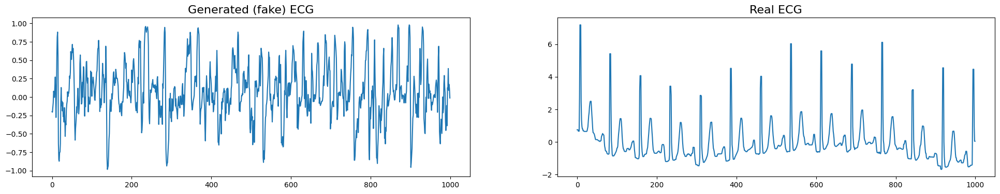

Epoch 2371/3000
Generator loss: 2.734015464782715
Discriminator loss: 178618688.0
-------------------
Epoch 2372/3000
Generator loss: 2.5608654022216797
Discriminator loss: 183809440.0
-------------------
Epoch 2373/3000
Generator loss: 2.6591620445251465
Discriminator loss: 183822592.0
-------------------
Epoch 2374/3000
Generator loss: 2.5782506465911865
Discriminator loss: 173731408.0
-------------------
Epoch 2375/3000
Generator loss: 2.8244266510009766
Discriminator loss: 170481120.0
-------------------
Epoch 2376/3000
Generator loss: 2.741482973098755
Discriminator loss: 175045504.0
-------------------
Epoch 2377/3000
Generator loss: 2.5800774097442627
Discriminator loss: 172633872.0
-------------------
Epoch 2378/3000
Generator loss: 2.862579345703125
Discriminator loss: 175435808.0
-------------------
Epoch 2379/3000
Generator loss: 2.5989785194396973
Discriminator loss: 183967792.0
-------------------
Epoch 2380/3000
Generator loss: 2.7136597633361816
Discriminator loss: 18412

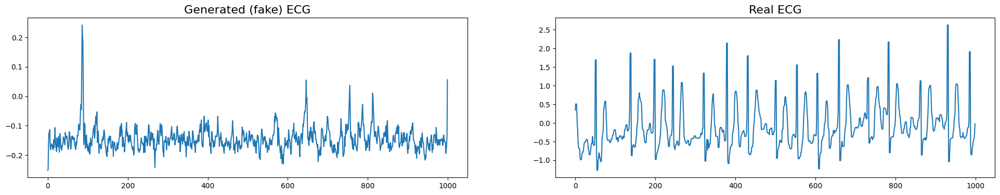

Epoch 2401/3000
Generator loss: 2.656036138534546
Discriminator loss: 178490672.0
-------------------
Epoch 2402/3000
Generator loss: 2.601046562194824
Discriminator loss: 179913920.0
-------------------
Epoch 2403/3000
Generator loss: 2.4578745365142822
Discriminator loss: 182298896.0
-------------------
Epoch 2404/3000
Generator loss: 2.6541335582733154
Discriminator loss: 170423312.0
-------------------
Epoch 2405/3000
Generator loss: 2.7091360092163086
Discriminator loss: 181457920.0
-------------------
Epoch 2406/3000
Generator loss: 2.6639962196350098
Discriminator loss: 180830240.0
-------------------
Epoch 2407/3000
Generator loss: 2.6920411586761475
Discriminator loss: 162533056.0
-------------------
Epoch 2408/3000
Generator loss: 2.5873517990112305
Discriminator loss: 177583392.0
-------------------
Epoch 2409/3000
Generator loss: 2.657048463821411
Discriminator loss: 182998688.0
-------------------
Epoch 2410/3000
Generator loss: 2.630868673324585
Discriminator loss: 178249

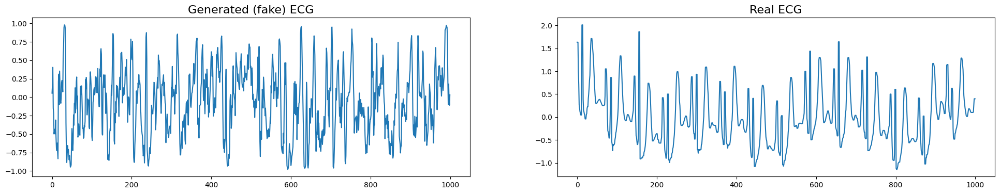

Epoch 2431/3000
Generator loss: 2.6166512966156006
Discriminator loss: 182606480.0
-------------------
Epoch 2432/3000
Generator loss: 2.590909242630005
Discriminator loss: 176737376.0
-------------------
Epoch 2433/3000
Generator loss: 2.6241750717163086
Discriminator loss: 172533072.0
-------------------
Epoch 2434/3000
Generator loss: 2.455512523651123
Discriminator loss: 180690944.0
-------------------
Epoch 2435/3000
Generator loss: 2.498105525970459
Discriminator loss: 178854336.0
-------------------
Epoch 2436/3000
Generator loss: 2.6297216415405273
Discriminator loss: 178882096.0
-------------------
Epoch 2437/3000
Generator loss: 2.7443008422851562
Discriminator loss: 177972960.0
-------------------
Epoch 2438/3000
Generator loss: 2.630855083465576
Discriminator loss: 187801952.0
-------------------
Epoch 2439/3000
Generator loss: 2.6365091800689697
Discriminator loss: 172964400.0
-------------------
Epoch 2440/3000
Generator loss: 2.6425623893737793
Discriminator loss: 171304

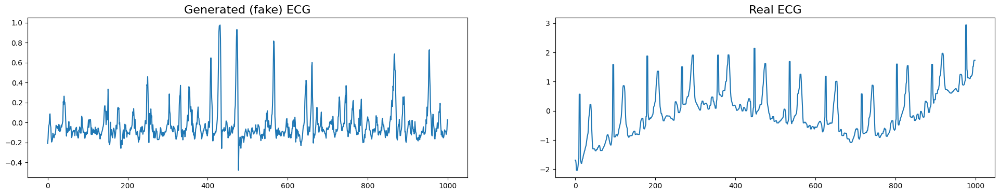

Epoch 2461/3000
Generator loss: 2.741150379180908
Discriminator loss: 176250816.0
-------------------
Epoch 2462/3000
Generator loss: 2.6832592487335205
Discriminator loss: 178710096.0
-------------------
Epoch 2463/3000
Generator loss: 2.6187334060668945
Discriminator loss: 173437584.0
-------------------
Epoch 2464/3000
Generator loss: 2.568366527557373
Discriminator loss: 189165040.0
-------------------
Epoch 2465/3000
Generator loss: 2.744990348815918
Discriminator loss: 180172448.0
-------------------
Epoch 2466/3000
Generator loss: 2.6712698936462402
Discriminator loss: 181011040.0
-------------------
Epoch 2467/3000
Generator loss: 2.5508084297180176
Discriminator loss: 177593120.0
-------------------
Epoch 2468/3000
Generator loss: 2.6193716526031494
Discriminator loss: 163928672.0
-------------------
Epoch 2469/3000
Generator loss: 2.992769241333008
Discriminator loss: 171512896.0
-------------------
Epoch 2470/3000
Generator loss: 2.745281934738159
Discriminator loss: 1725405

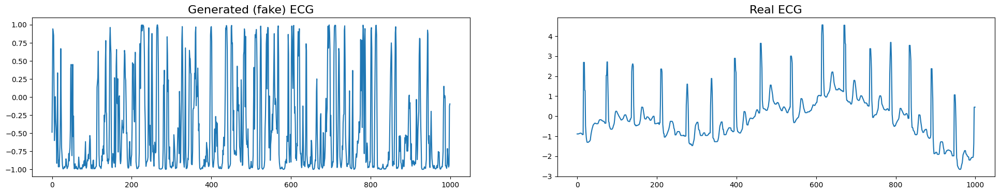

Epoch 2491/3000
Generator loss: 2.5372867584228516
Discriminator loss: 187814464.0
-------------------
Epoch 2492/3000
Generator loss: 2.4901537895202637
Discriminator loss: 177222976.0
-------------------
Epoch 2493/3000
Generator loss: 2.5254852771759033
Discriminator loss: 174411328.0
-------------------
Epoch 2494/3000
Generator loss: 2.628483295440674
Discriminator loss: 179074976.0
-------------------
Epoch 2495/3000
Generator loss: 2.630756378173828
Discriminator loss: 182196528.0
-------------------
Epoch 2496/3000
Generator loss: 2.859288215637207
Discriminator loss: 174440784.0
-------------------
Epoch 2497/3000
Generator loss: 2.6103439331054688
Discriminator loss: 175257584.0
-------------------
Epoch 2498/3000
Generator loss: 2.672351360321045
Discriminator loss: 179875536.0
-------------------
Epoch 2499/3000
Generator loss: 2.6000256538391113
Discriminator loss: 179824736.0
-------------------
Epoch 2500/3000
Generator loss: 2.6509130001068115
Discriminator loss: 176326

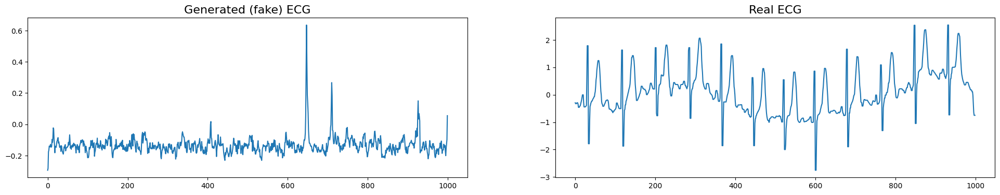

Epoch 2521/3000
Generator loss: 2.593736410140991
Discriminator loss: 177715648.0
-------------------
Epoch 2522/3000
Generator loss: 2.7705678939819336
Discriminator loss: 178667520.0
-------------------
Epoch 2523/3000
Generator loss: 2.6475415229797363
Discriminator loss: 177064080.0
-------------------
Epoch 2524/3000
Generator loss: 2.679750442504883
Discriminator loss: 182622912.0
-------------------
Epoch 2525/3000
Generator loss: 2.691852569580078
Discriminator loss: 182939776.0
-------------------
Epoch 2526/3000
Generator loss: 2.517482280731201
Discriminator loss: 169908352.0
-------------------
Epoch 2527/3000
Generator loss: 2.612496852874756
Discriminator loss: 176311248.0
-------------------
Epoch 2528/3000
Generator loss: 2.57537579536438
Discriminator loss: 177998912.0
-------------------
Epoch 2529/3000
Generator loss: 2.6041626930236816
Discriminator loss: 182395744.0
-------------------
Epoch 2530/3000
Generator loss: 2.6352243423461914
Discriminator loss: 179237008

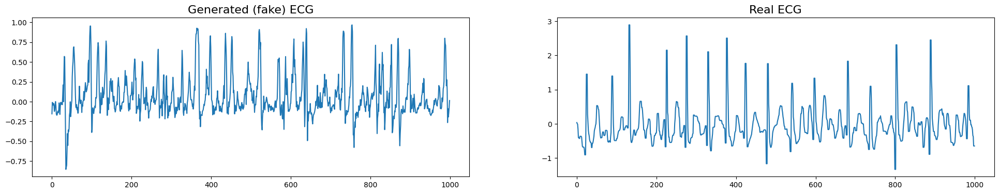

Epoch 2551/3000
Generator loss: 2.484622001647949
Discriminator loss: 175068256.0
-------------------
Epoch 2552/3000
Generator loss: 2.5932059288024902
Discriminator loss: 177501728.0
-------------------
Epoch 2553/3000
Generator loss: 2.638093948364258
Discriminator loss: 168837600.0
-------------------
Epoch 2554/3000
Generator loss: 2.779975652694702
Discriminator loss: 178903920.0
-------------------
Epoch 2555/3000
Generator loss: 2.7261996269226074
Discriminator loss: 171344160.0
-------------------
Epoch 2556/3000
Generator loss: 2.672691822052002
Discriminator loss: 177482464.0
-------------------
Epoch 2557/3000
Generator loss: 2.6336333751678467
Discriminator loss: 179729824.0
-------------------
Epoch 2558/3000
Generator loss: 2.7309722900390625
Discriminator loss: 174360256.0
-------------------
Epoch 2559/3000
Generator loss: 2.7799768447875977
Discriminator loss: 174832288.0
-------------------
Epoch 2560/3000
Generator loss: 2.7313289642333984
Discriminator loss: 179502

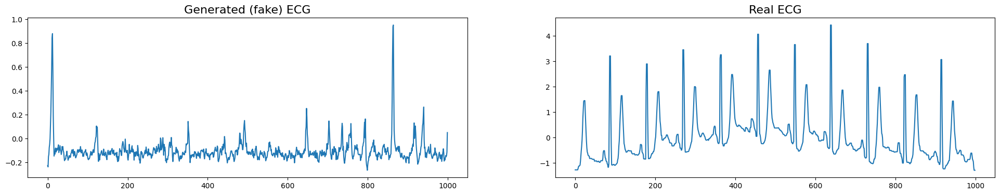

Epoch 2581/3000
Generator loss: 2.6903889179229736
Discriminator loss: 176479728.0
-------------------
Epoch 2582/3000
Generator loss: 2.5796499252319336
Discriminator loss: 181905424.0
-------------------
Epoch 2583/3000
Generator loss: 2.596423387527466
Discriminator loss: 179185952.0
-------------------
Epoch 2584/3000
Generator loss: 2.7469029426574707
Discriminator loss: 176930288.0
-------------------
Epoch 2585/3000
Generator loss: 2.639788866043091
Discriminator loss: 174410864.0
-------------------
Epoch 2586/3000
Generator loss: 2.5887675285339355
Discriminator loss: 182090400.0
-------------------
Epoch 2587/3000
Generator loss: 2.774479866027832
Discriminator loss: 179127696.0
-------------------
Epoch 2588/3000
Generator loss: 2.619844436645508
Discriminator loss: 182120768.0
-------------------
Epoch 2589/3000
Generator loss: 2.600625514984131
Discriminator loss: 173714848.0
-------------------
Epoch 2590/3000
Generator loss: 2.6945817470550537
Discriminator loss: 1822825

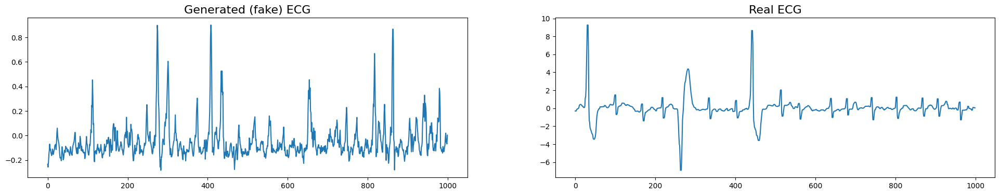

Epoch 2611/3000
Generator loss: 2.6772170066833496
Discriminator loss: 175187648.0
-------------------
Epoch 2612/3000
Generator loss: 2.67368483543396
Discriminator loss: 178116032.0
-------------------
Epoch 2613/3000
Generator loss: 2.8409924507141113
Discriminator loss: 181091264.0
-------------------
Epoch 2614/3000
Generator loss: 2.6591796875
Discriminator loss: 175150432.0
-------------------
Epoch 2615/3000
Generator loss: 2.752559185028076
Discriminator loss: 180768896.0
-------------------
Epoch 2616/3000
Generator loss: 2.639360189437866
Discriminator loss: 175707200.0
-------------------
Epoch 2617/3000
Generator loss: 2.581753730773926
Discriminator loss: 173503968.0
-------------------
Epoch 2618/3000
Generator loss: 2.6521828174591064
Discriminator loss: 181780944.0
-------------------
Epoch 2619/3000
Generator loss: 2.633697509765625
Discriminator loss: 180744224.0
-------------------
Epoch 2620/3000
Generator loss: 2.659743070602417
Discriminator loss: 180237312.0
---

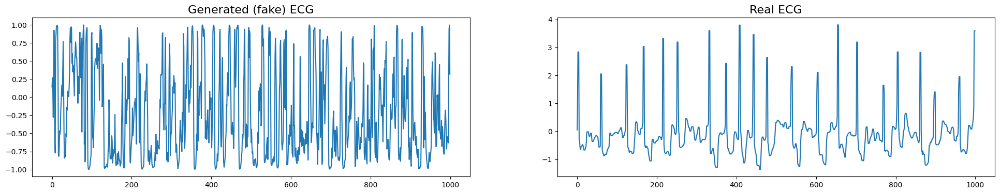

Epoch 2641/3000
Generator loss: 2.474982976913452
Discriminator loss: 179085744.0
-------------------
Epoch 2642/3000
Generator loss: 2.622809410095215
Discriminator loss: 172495488.0
-------------------
Epoch 2643/3000
Generator loss: 2.880256175994873
Discriminator loss: 173734064.0
-------------------
Epoch 2644/3000
Generator loss: 2.6536030769348145
Discriminator loss: 174140016.0
-------------------
Epoch 2645/3000
Generator loss: 2.6256766319274902
Discriminator loss: 184696064.0
-------------------
Epoch 2646/3000
Generator loss: 2.50907301902771
Discriminator loss: 181913008.0
-------------------
Epoch 2647/3000
Generator loss: 2.6214423179626465
Discriminator loss: 176831568.0
-------------------
Epoch 2648/3000
Generator loss: 2.613163471221924
Discriminator loss: 182167536.0
-------------------
Epoch 2649/3000
Generator loss: 2.608919382095337
Discriminator loss: 179965280.0
-------------------
Epoch 2650/3000
Generator loss: 2.70697021484375
Discriminator loss: 175728992.0

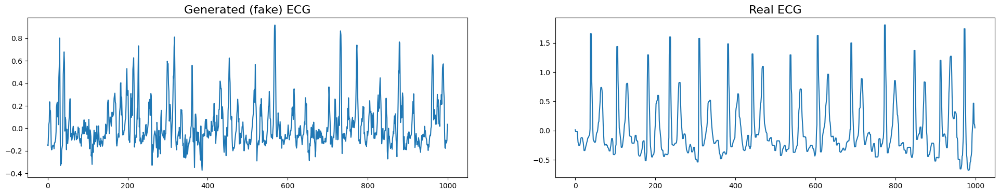

Epoch 2671/3000
Generator loss: 2.5413713455200195
Discriminator loss: 179029136.0
-------------------
Epoch 2672/3000
Generator loss: 2.789984941482544
Discriminator loss: 179552688.0
-------------------
Epoch 2673/3000
Generator loss: 2.7043187618255615
Discriminator loss: 179167520.0
-------------------
Epoch 2674/3000
Generator loss: 2.567509889602661
Discriminator loss: 182437536.0
-------------------
Epoch 2675/3000
Generator loss: 2.6011734008789062
Discriminator loss: 182067648.0
-------------------
Epoch 2676/3000
Generator loss: 2.662667751312256
Discriminator loss: 172086960.0
-------------------
Epoch 2677/3000
Generator loss: 2.6343393325805664
Discriminator loss: 183419856.0
-------------------
Epoch 2678/3000
Generator loss: 2.5125668048858643
Discriminator loss: 170046720.0
-------------------
Epoch 2679/3000
Generator loss: 2.6211609840393066
Discriminator loss: 174467520.0
-------------------
Epoch 2680/3000
Generator loss: 2.607408046722412
Discriminator loss: 177895

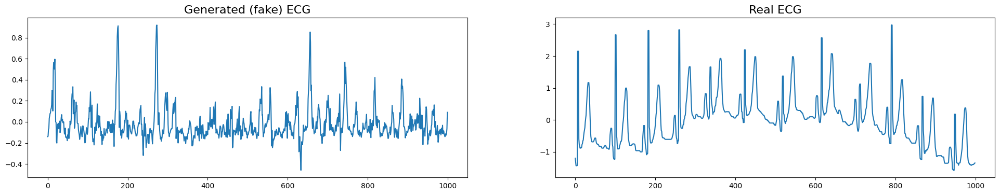

Epoch 2701/3000
Generator loss: 2.9863626956939697
Discriminator loss: 169851792.0
-------------------
Epoch 2702/3000
Generator loss: 2.6842997074127197
Discriminator loss: 178156528.0
-------------------
Epoch 2703/3000
Generator loss: 2.7302205562591553
Discriminator loss: 178409936.0
-------------------
Epoch 2704/3000
Generator loss: 2.590946674346924
Discriminator loss: 167219120.0
-------------------
Epoch 2705/3000
Generator loss: 2.5581092834472656
Discriminator loss: 161023328.0
-------------------
Epoch 2706/3000
Generator loss: 2.606174945831299
Discriminator loss: 182371552.0
-------------------
Epoch 2707/3000
Generator loss: 2.635822057723999
Discriminator loss: 169329024.0
-------------------
Epoch 2708/3000
Generator loss: 2.601480722427368
Discriminator loss: 178193504.0
-------------------
Epoch 2709/3000
Generator loss: 2.6407601833343506
Discriminator loss: 186827296.0
-------------------
Epoch 2710/3000
Generator loss: 2.7324466705322266
Discriminator loss: 183848

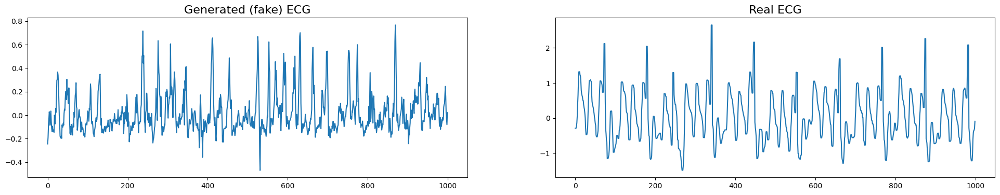

Epoch 2731/3000
Generator loss: 2.648693561553955
Discriminator loss: 181278944.0
-------------------
Epoch 2732/3000
Generator loss: 2.619215488433838
Discriminator loss: 175849344.0
-------------------
Epoch 2733/3000
Generator loss: 2.670362949371338
Discriminator loss: 179823312.0
-------------------
Epoch 2734/3000
Generator loss: 2.6197445392608643
Discriminator loss: 172534320.0
-------------------
Epoch 2735/3000
Generator loss: 2.6174111366271973
Discriminator loss: 174616512.0
-------------------
Epoch 2736/3000
Generator loss: 2.7280666828155518
Discriminator loss: 172588800.0
-------------------
Epoch 2737/3000
Generator loss: 2.635758638381958
Discriminator loss: 172520496.0
-------------------
Epoch 2738/3000
Generator loss: 2.6788206100463867
Discriminator loss: 171130048.0
-------------------
Epoch 2739/3000
Generator loss: 2.638120651245117
Discriminator loss: 170137088.0
-------------------
Epoch 2740/3000
Generator loss: 2.533395767211914
Discriminator loss: 18248497

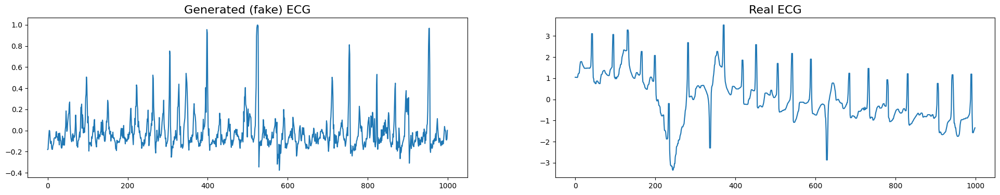

Epoch 2761/3000
Generator loss: 2.697892665863037
Discriminator loss: 178887040.0
-------------------
Epoch 2762/3000
Generator loss: 2.5473175048828125
Discriminator loss: 192192832.0
-------------------
Epoch 2763/3000
Generator loss: 2.6594736576080322
Discriminator loss: 173448928.0
-------------------
Epoch 2764/3000
Generator loss: 2.656888723373413
Discriminator loss: 169295616.0
-------------------
Epoch 2765/3000
Generator loss: 2.6167049407958984
Discriminator loss: 179707584.0
-------------------
Epoch 2766/3000
Generator loss: 2.70434832572937
Discriminator loss: 175158288.0
-------------------
Epoch 2767/3000
Generator loss: 2.6893911361694336
Discriminator loss: 167595584.0
-------------------
Epoch 2768/3000
Generator loss: 2.61069917678833
Discriminator loss: 174778048.0
-------------------
Epoch 2769/3000
Generator loss: 2.56182861328125
Discriminator loss: 179885696.0
-------------------
Epoch 2770/3000
Generator loss: 2.5928096771240234
Discriminator loss: 176462432.

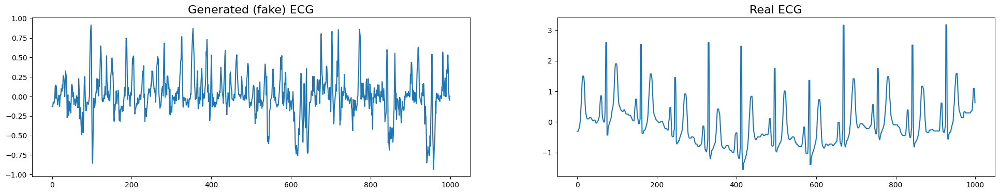

Epoch 2791/3000
Generator loss: 2.6441688537597656
Discriminator loss: 179529472.0
-------------------
Epoch 2792/3000
Generator loss: 2.5897178649902344
Discriminator loss: 185152064.0
-------------------
Epoch 2793/3000
Generator loss: 2.53385329246521
Discriminator loss: 171517984.0
-------------------
Epoch 2794/3000
Generator loss: 2.6163976192474365
Discriminator loss: 176145376.0
-------------------
Epoch 2795/3000
Generator loss: 2.627121925354004
Discriminator loss: 177936512.0
-------------------
Epoch 2796/3000
Generator loss: 2.6776413917541504
Discriminator loss: 172577536.0
-------------------
Epoch 2797/3000
Generator loss: 2.6607608795166016
Discriminator loss: 177715840.0
-------------------
Epoch 2798/3000
Generator loss: 2.592444658279419
Discriminator loss: 177083648.0
-------------------
Epoch 2799/3000
Generator loss: 2.906517744064331
Discriminator loss: 174783408.0
-------------------
Epoch 2800/3000
Generator loss: 2.611300468444824
Discriminator loss: 17673153

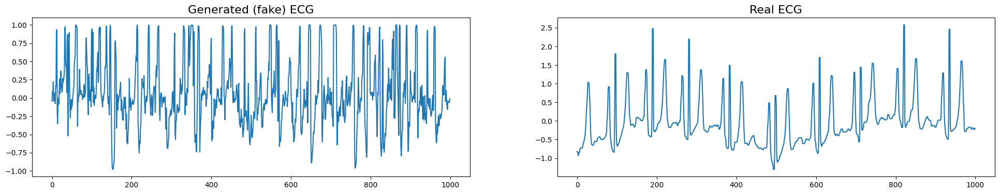

Epoch 2821/3000
Generator loss: 2.643169403076172
Discriminator loss: 172492944.0
-------------------
Epoch 2822/3000
Generator loss: 2.5514776706695557
Discriminator loss: 183628928.0
-------------------
Epoch 2823/3000
Generator loss: 2.614795207977295
Discriminator loss: 184575776.0
-------------------
Epoch 2824/3000
Generator loss: 2.6551785469055176
Discriminator loss: 175820928.0
-------------------
Epoch 2825/3000
Generator loss: 2.5931642055511475
Discriminator loss: 177109216.0
-------------------
Epoch 2826/3000
Generator loss: 2.7145748138427734
Discriminator loss: 176907728.0
-------------------
Epoch 2827/3000
Generator loss: 2.658933639526367
Discriminator loss: 173561024.0
-------------------
Epoch 2828/3000
Generator loss: 2.707839012145996
Discriminator loss: 166891520.0
-------------------
Epoch 2829/3000
Generator loss: 2.659182548522949
Discriminator loss: 174895520.0
-------------------
Epoch 2830/3000
Generator loss: 2.6375088691711426
Discriminator loss: 1738501

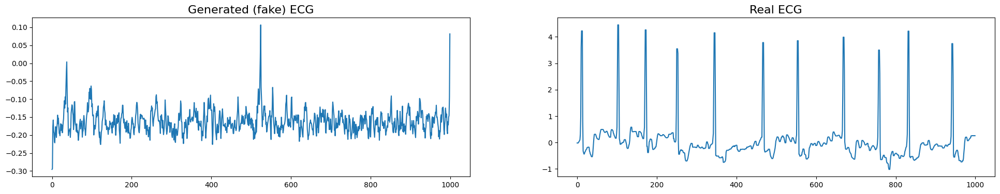

Epoch 2851/3000
Generator loss: 2.6729490756988525
Discriminator loss: 174547552.0
-------------------
Epoch 2852/3000
Generator loss: 2.7095437049865723
Discriminator loss: 176546528.0
-------------------
Epoch 2853/3000
Generator loss: 2.656367301940918
Discriminator loss: 185440160.0
-------------------
Epoch 2854/3000
Generator loss: 2.7004337310791016
Discriminator loss: 180355648.0
-------------------
Epoch 2855/3000
Generator loss: 2.5592539310455322
Discriminator loss: 179860512.0
-------------------
Epoch 2856/3000
Generator loss: 2.588834285736084
Discriminator loss: 178335696.0
-------------------
Epoch 2857/3000
Generator loss: 2.672612190246582
Discriminator loss: 182875696.0
-------------------
Epoch 2858/3000
Generator loss: 2.617400646209717
Discriminator loss: 173330576.0
-------------------
Epoch 2859/3000
Generator loss: 2.6334400177001953
Discriminator loss: 180556688.0
-------------------
Epoch 2860/3000
Generator loss: 2.6924285888671875
Discriminator loss: 172155

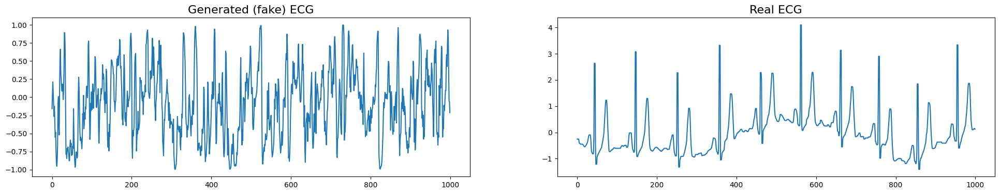

Epoch 2881/3000
Generator loss: 2.6785476207733154
Discriminator loss: 175265248.0
-------------------
Epoch 2882/3000
Generator loss: 2.6313042640686035
Discriminator loss: 181673856.0
-------------------
Epoch 2883/3000
Generator loss: 2.9416661262512207
Discriminator loss: 170956688.0
-------------------
Epoch 2884/3000
Generator loss: 2.6458964347839355
Discriminator loss: 177561072.0
-------------------
Epoch 2885/3000
Generator loss: 2.6406171321868896
Discriminator loss: 171018240.0
-------------------
Epoch 2886/3000
Generator loss: 2.6049304008483887
Discriminator loss: 168924704.0
-------------------
Epoch 2887/3000
Generator loss: 2.6454806327819824
Discriminator loss: 173554272.0
-------------------
Epoch 2888/3000
Generator loss: 2.6697702407836914
Discriminator loss: 179590464.0
-------------------
Epoch 2889/3000
Generator loss: 2.6472067832946777
Discriminator loss: 174646768.0
-------------------
Epoch 2890/3000
Generator loss: 2.708293914794922
Discriminator loss: 178

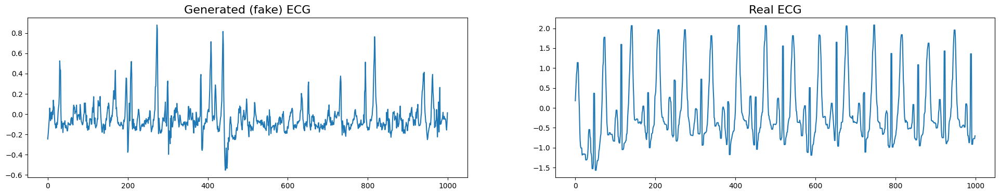

Epoch 2911/3000
Generator loss: 2.567713737487793
Discriminator loss: 189464224.0
-------------------
Epoch 2912/3000
Generator loss: 2.6698036193847656
Discriminator loss: 180149216.0
-------------------
Epoch 2913/3000
Generator loss: 2.580545425415039
Discriminator loss: 181445456.0
-------------------
Epoch 2914/3000
Generator loss: 2.6014349460601807
Discriminator loss: 182333664.0
-------------------
Epoch 2915/3000
Generator loss: 2.7714290618896484
Discriminator loss: 179701312.0
-------------------
Epoch 2916/3000
Generator loss: 2.6527528762817383
Discriminator loss: 169129392.0
-------------------
Epoch 2917/3000
Generator loss: 2.6314072608947754
Discriminator loss: 173531488.0
-------------------
Epoch 2918/3000
Generator loss: 2.652276039123535
Discriminator loss: 175858704.0
-------------------
Epoch 2919/3000
Generator loss: 2.5687923431396484
Discriminator loss: 178220720.0
-------------------
Epoch 2920/3000
Generator loss: 2.5667996406555176
Discriminator loss: 18959

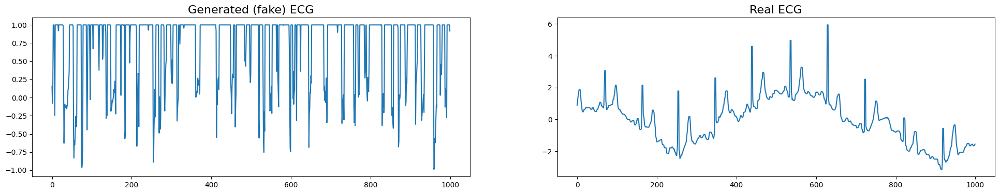

Epoch 2941/3000
Generator loss: 2.666776418685913
Discriminator loss: 176913152.0
-------------------
Epoch 2942/3000
Generator loss: 2.622720718383789
Discriminator loss: 173518896.0
-------------------
Epoch 2943/3000
Generator loss: 2.6669576168060303
Discriminator loss: 179427584.0
-------------------
Epoch 2944/3000
Generator loss: 2.6056880950927734
Discriminator loss: 173779856.0
-------------------
Epoch 2945/3000
Generator loss: 2.7163357734680176
Discriminator loss: 173391808.0
-------------------
Epoch 2946/3000
Generator loss: 2.5878963470458984
Discriminator loss: 168367184.0
-------------------
Epoch 2947/3000
Generator loss: 2.650195598602295
Discriminator loss: 179214064.0
-------------------
Epoch 2948/3000
Generator loss: 2.5106558799743652
Discriminator loss: 176434960.0
-------------------
Epoch 2949/3000
Generator loss: 2.685453176498413
Discriminator loss: 170325376.0
-------------------
Epoch 2950/3000
Generator loss: 2.6256444454193115
Discriminator loss: 177750

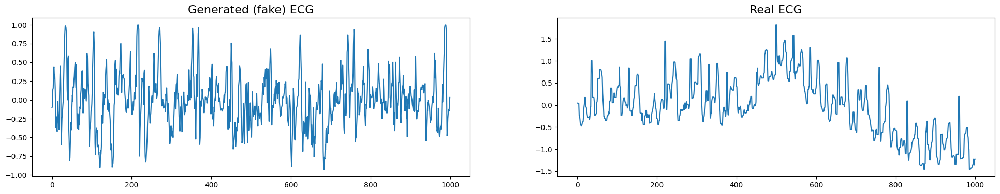

Epoch 2971/3000
Generator loss: 2.7009286880493164
Discriminator loss: 171542816.0
-------------------
Epoch 2972/3000
Generator loss: 2.6277666091918945
Discriminator loss: 175692336.0
-------------------
Epoch 2973/3000
Generator loss: 2.640127182006836
Discriminator loss: 176680736.0
-------------------
Epoch 2974/3000
Generator loss: 2.7057015895843506
Discriminator loss: 182540800.0
-------------------
Epoch 2975/3000
Generator loss: 2.5591306686401367
Discriminator loss: 176349312.0
-------------------
Epoch 2976/3000
Generator loss: 2.5935349464416504
Discriminator loss: 175301424.0
-------------------
Epoch 2977/3000
Generator loss: 2.592040777206421
Discriminator loss: 185359456.0
-------------------
Epoch 2978/3000
Generator loss: 2.692004680633545
Discriminator loss: 175229152.0
-------------------
Epoch 2979/3000
Generator loss: 2.5466108322143555
Discriminator loss: 183044384.0
-------------------
Epoch 2980/3000
Generator loss: 2.5468645095825195
Discriminator loss: 16952

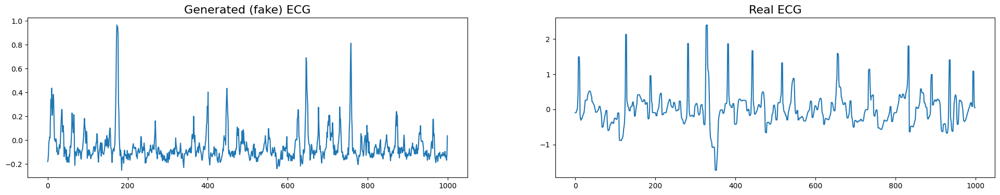

Saved generator weights to: /home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/inspectionmodel_generator_epoch_3000.weights.h5
Saved discriminator weights to: /home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/inspectionmodel_discriminator_epoch_3000.weights.h5


In [23]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"GPUs available: {len(gpus)}")
    except RuntimeError as e:
        print(f"Error configuring GPUs: {e}")
else:
    print("No GPUs available.")


tf.debugging.set_log_device_placement(True)


clip_value = 1.0  

# Define optimizers with gradient clipping
opt_gen = tf.keras.optimizers.Adam(learning_rate=lr_schedule, clipvalue=clip_value)
opt_desc = tf.keras.optimizers.Adam(learning_rate=lr_schedule, clipvalue=clip_value)

# Updated train step
def train_step(real_data, labels):
    noise = tf.random.normal([batch_size, latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate fake data
        generated_data = con_gen([noise, labels], training=True)

        # Get discriminator outputs
        real_output = con_desc([real_data, labels], training=True)
        fake_output = con_desc([generated_data, labels], training=True)
        real_output = real_output[0] if isinstance(real_output, list) else real_output
        fake_output = fake_output[0] if isinstance(fake_output, list) else fake_output

        # Smooth labels for training stability
        y_real_smooth = smooth_positive_labels(tf.ones_like(real_output)* 0.9)  # Same shape as real_output
        y_fake_smooth = smooth_negative_labels(tf.zeros_like(fake_output))  # Same shape as fake_output

        # Discriminator Loss
        disc_loss_real = tf.reduce_mean(tf.keras.losses.binary_crossentropy(y_real_smooth, real_output))
        disc_loss_fake = tf.reduce_mean(tf.keras.losses.binary_crossentropy(y_fake_smooth, fake_output))
        
        # Apply gradient penalty (WGAN)
        loss_gp = gradient_penalty_layer(real_data, generated_data, labels)
        disc_loss = disc_loss_real + disc_loss_fake + 3.0 * loss_gp  # Reduced gradient penalty

        # Generator Loss
        gen_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(fake_output), fake_output))

        # Add Temporal Coherence Loss to Generator Loss
        tc_loss = temporal_coherence_loss(real_data, generated_data)
        gen_loss += tc_loss  # Add temporal coherence loss to the generator's total loss
        gen_loss += feature_matching_loss(real_output, fake_output)

    # Compute Gradients
    gradients_of_gen = gen_tape.gradient(gen_loss, con_gen.trainable_variables)
    gradients_of_disc = disc_tape.gradient(disc_loss, con_desc.trainable_variables)

    # Apply Gradients with clipping
    opt_gen.apply_gradients(zip(gradients_of_gen, con_gen.trainable_variables))
    opt_desc.apply_gradients(zip(gradients_of_disc, con_desc.trainable_variables))

    return gen_loss, disc_loss


# Training Loop 
for epoch in range(epochs):
    print(f"Epoch {epoch + 1}/{epochs}")

    for step in range(steps_per_epoch):
        # Generate real samples
        x_real, y_real = generate_real_samples(ECGs, y_train, batch_size)
        x_real_tensor = tf.convert_to_tensor(x_real, dtype=tf.float32)
        y_real_tensor = tf.convert_to_tensor(y_real, dtype=tf.float32)

        # Perform a training step
        gen_loss, disc_loss = train_step(x_real_tensor, y_real_tensor)
        # Call the reduce learning rate callback manually after each epoch
        reduce_lr_gen.on_epoch_end(epoch, logs={'loss': gen_loss.numpy()})
        reduce_lr_desc.on_epoch_end(epoch, logs={'loss': disc_loss.numpy()})

        # Store losses for tracking
        accu_loss_gan.append(gen_loss)      
        accu_loss_desc.append(disc_loss)

    # Print the losses for the epoch
    print(f"Generator loss: {gen_loss.numpy()}")
    print(f"Discriminator loss: {disc_loss.numpy()}")
    print("-------------------")

    # Call the reduce learning rate callback manually after each epoch
    reduce_lr_gen.on_epoch_end(epoch, logs={'loss': gen_loss.numpy()})
    reduce_lr_desc.on_epoch_end(epoch, logs={'loss': disc_loss.numpy()})

    # Save generator and discriminator models periodically
    if (epoch + 1) % 30 == 0:
        res = con_gen.predict([generate_latent_points(latent_dim, 1), tf.convert_to_tensor(np.array([[0]]), dtype=tf.float32)])
        compare_real_and_gen_ecg(res, ECGs)

    # Save weights every 2000 epochs
    if (epoch + 1) % 3000 == 0:
        gen_save_path = os.path.join('/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data', f'inspectionmodel_generator_epoch_{epoch + 1}.weights.h5')
        desc_save_path = os.path.join('/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data', f'inspectionmodel_discriminator_epoch_{epoch + 1}.weights.h5')

        con_gen.save_weights(gen_save_path)
        con_desc.save_weights(desc_save_path)

        print(f'Saved generator weights to: {gen_save_path}')
        print(f'Saved discriminator weights to: {desc_save_path}')




In [25]:
from sklearn.metrics import mean_squared_error, r2_score
from scipy.linalg import sqrtm

# Load your trained models
gen_model_path = os.path.join('/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data', 'inspectionmodel_generator_epoch_3000.weights.h5')
desc_model_path = os.path.join('/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data', 'inspectionmodel_discriminator_epoch_3000.weights.h5')

con_gen.load_weights(gen_model_path)
con_desc.load_weights(desc_model_path)

# Latent Dimension and Batch Size
latent_dim = 12
batch_size = 64

# Quantitative Metrics for Generator
def evaluate_generator_quality(real_ecgs, generated_ecgs):
    # Ensure the inputs are NumPy arrays
    real_ecgs_flat = real_ecgs if isinstance(real_ecgs, np.ndarray) else real_ecgs.numpy()
    generated_ecgs_flat = generated_ecgs if isinstance(generated_ecgs, np.ndarray) else generated_ecgs.numpy()
    
    # Flatten the arrays for metric computation
    real_ecgs_flat = real_ecgs_flat.flatten()
    generated_ecgs_flat = generated_ecgs_flat.flatten()
    
    # Compute metrics
    mse = mean_squared_error(real_ecgs_flat, generated_ecgs_flat)
    r2 = r2_score(real_ecgs_flat, generated_ecgs_flat)
    
    print(f"Generator Quality Metrics:")
    print(f"  Mean Squared Error (MSE): {mse:.4f}")
    print(f"  R-Squared (R2): {r2:.4f}")

def evaluate_discriminator(discriminator, real_ecgs, generated_ecgs, labels):
    # Ensure all inputs are TensorFlow tensors
    real_ecgs = tf.convert_to_tensor(real_ecgs, dtype=tf.float32)
    generated_ecgs = tf.convert_to_tensor(generated_ecgs, dtype=tf.float32)
    labels = tf.convert_to_tensor(labels, dtype=tf.float32)
    
    # Pass tensors to the discriminator
    real_output = discriminator([real_ecgs, labels], training=False)
    fake_output = discriminator([generated_ecgs, labels], training=False)
    
    # Print mean outputs
    print("Discriminator Outputs:")
    print(f"  Real ECGs Mean Output: {tf.reduce_mean(real_output).numpy():.4f}")
    print(f"  Generated ECGs Mean Output: {tf.reduce_mean(fake_output).numpy():.4f}")


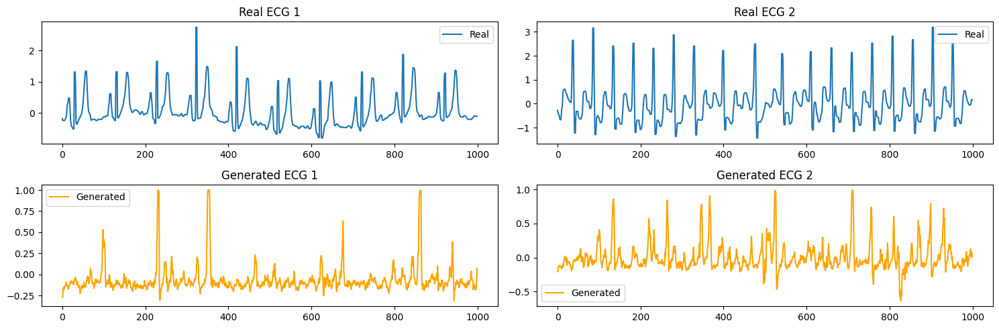

In [41]:
# 1. Generator Evaluation: Generate Synthetic ECG Data
def generate_synthetic_ecgs(generator, latent_dim, labels, num_samples):
    noise = tf.random.normal([num_samples, latent_dim])
    generated_ecgs = generator([noise, labels[:num_samples]], training=False)  # Match label count
    return generated_ecgs.numpy()

# 2. Plot Real vs. Generated ECGs for Comparison
def plot_real_vs_generated(real_ecgs, generated_ecgs, num_samples=2):
    plt.figure(figsize=(15, 5))
    for i in range(num_samples):
        # Plot Real ECG
        plt.subplot(2, num_samples, i + 1)
        plt.plot(tf.reshape(real_ecgs[i], [-1]).numpy(), label="Real")  # Flatten and convert to NumPy
        plt.title(f"Real ECG {i+1}")
        plt.legend()

        # Plot Generated ECG
        plt.subplot(2, num_samples, num_samples + i + 1)
        plt.plot(tf.reshape(generated_ecgs[i], [-1]).numpy(), label="Generated", color='orange')  # Flatten and convert to NumPy
        plt.title(f"Generated ECG {i+1}")
        plt.legend()

    plt.tight_layout()
    plt.show()


test_labels = tf.convert_to_tensor(y_test, dtype=tf.float32)
real_samples = tf.convert_to_tensor(ECGs_test, dtype=tf.float32)

# Generate Synthetic ECGs
synthetic_samples = generate_synthetic_ecgs(con_gen, latent_dim, test_labels, num_samples)

# Visual Comparison
plot_real_vs_generated(real_samples, synthetic_samples)

In [28]:
# Quantitative Metrics
evaluate_generator_quality(real_samples, synthetic_samples)



Generator Quality Metrics:
  Mean Squared Error (MSE): 1.3899
  R-Squared (R2): -0.1475


In [30]:
from tensorflow.keras.models import load_model, Model

# Reload the saved model
saved_model_path = '/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/feature_extractor_model.h5'
loaded_model = load_model(saved_model_path)
from keras.layers import Input 
# Define the input tensor with the correct shape
input_tensor = Input(shape=(1000, 1))  # Adjust shape based on your input data
model_output = loaded_model(input_tensor)  # Call the model with the new input tensor

# Create the feature extractor using the desired output layer
feature_extractor = Model(inputs=input_tensor, outputs=loaded_model.get_layer('dense_2').output)

# Verify the feature extractor model
feature_extractor.summary()

# Save the feature extractor for later use
feature_extractor_save_path = '/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/feature_extractor_model2.h5'
feature_extractor.save(feature_extractor_save_path)
print(f"Feature extractor saved at {feature_extractor_save_path}")

Model: "functional_33"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 1000, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_6 (Conv1D)   │ (None, 998, 64)   │        256 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 998, 64)   │        256 │ conv1d_6[24][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_6     │ (None, 499, 64)   │          0 │ batch_normalizat… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 499, 64)   │          0 │ max_pooling1d_6[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_7 (Conv1D)   │ (None, 497, 32)   │      6,176 │ dropout_6[21][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 497, 32)   │        128 │ conv1d_7[20][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_7     │ (None, 248, 32)   │          0 │ batch_normalizat… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 248, 32)   │          0 │ max_pooling1d_7[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_8 (Conv1D)   │ (None, 246, 32)   │      3,104 │ dropout_7[17][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 246, 32)   │        128 │ conv1d_8[16][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_8     │ (None, 123, 32)   │          0 │ batch_normalizat… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 123, 32)   │          0 │ max_pooling1d_8[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_9 (Conv1D)   │ (None, 121, 16)   │      1,552 │ dropout_8[13][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 121, 16)   │         64 │ conv1d_9[12][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_9     │ (None, 60, 16)    │          0 │ batch_normalizat… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 60, 16)    │          0 │ max_pooling1d_9[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_10 (Conv1D)  │ (None, 58, 16)    │        784 │ dropout_9[9][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 58, 16)    │         64 │ conv1d_10[8][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_10    │ (None, 29, 16)    │          0 │ batch_normalizat

 Total params: 26,736 (104.44 KB)

 Trainable params: 26,384 (103.06 KB)

 Non-trainable params: 352 (1.38 KB)

Feature extractor saved at /home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/feature_extractor_model2.h5


In [31]:
input_tensor = Input(shape=(1000, 1))  # The input shape is (1000, 1)
feature_extractor_output = loaded_model(input_tensor)  # Use the loaded model to generate output
feature_extractor = Model(inputs=input_tensor, outputs=feature_extractor_output)

# Verify the feature extractor's summary
feature_extractor.summary()

# Now try extracting features
real_ecg_samples = ECGs_test[:100]  # Ensure these are properly formatted
try:
    extracted_features = feature_extractor.predict(real_ecg_samples)
    print("Extracted Features Shape:", extracted_features.shape)
except Exception as e:
    print("Error during feature extraction:", e)

Model: "functional_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 1000, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (None, 1)              │        26,801 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,801 (104.69 KB)

 Trainable params: 26,449 (103.32 KB)

 Non-trainable params: 352 (1.38 KB)

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step
Extracted Features Shape: (100, 1)


In [32]:

def calculate_fid(real_samples, generated_samples, feature_extractor):
    # Extract features from real and generated samples
    real_features = feature_extractor.predict(real_samples)
    gen_features = feature_extractor.predict(generated_samples)

    # Calculate mean and covariance
    mu_real, sigma_real = np.mean(real_features, axis=0), np.cov(real_features, rowvar=False)
    mu_gen, sigma_gen = np.mean(gen_features, axis=0), np.cov(gen_features, rowvar=False)

    # Ensure covariance matrices are 2D
    sigma_real = np.atleast_2d(sigma_real)
    sigma_gen = np.atleast_2d(sigma_gen)

    # Calculate the difference between the means
    diff = mu_real - mu_gen

    # Calculate the square root of the product of the covariance matrices
    covmean, _ = sqrtm(sigma_real.dot(sigma_gen), disp=False)

    # Ensure the resulting covariance matrix is real (i.e., handle potential complex values)
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    # Calculate FID score
    fid = diff.dot(diff) + np.trace(sigma_real + sigma_gen - 2.0 * covmean)
    return fid

# Example usage
fid_score = calculate_fid(real_samples, synthetic_samples, feature_extractor)
print(f"FID Score: {fid_score}")


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
FID Score: 0.1479114764215606
